In [1]:
#######################################################################################
# Read Me Section:
## Name:
# Kaylen Smith Darnbrook
# Student ID:
# 2135667
# Course:
# M.S.c Machine Learning and Artificial Intelligence
# Module:
## DemonstrationFaceGeneration 
## Description: 
# This module is responsible for creating, experimentation and evaluation of the 
# alternative architectures for the generation of faces using the Generative
# Accumulation Of Photons. The module will also be responsible for the analysis of the faces generated.
# This module is responsible for creating the experimentation and creation of
# pipeline for the generation of faces using the Generative Accumulation Of Photons.
# The module will also be responsible for the analysis of the faces generated.
# This jupyter notebook builds upon the previous work done by the original authors
# which can be found at the following link:
# https://github.com/krulllab/GAP
#####################################################################################

In [2]:
# Import Relevant Libraries:

# Import modules for system managment, io and file management 
import os 
import sys
import time 
import random

# Import modules for data manipulation and analysis
import numpy as np
import pandas as pd
import scipy as sp

# Import modules for data visualisation
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid", {"axes.facecolor": ".9"})
sns.set_context("notebook")
from PIL import Image

# Import modules for Deep learning
import torch
from torch.utils.data import DataLoader
torch.set_float32_matmul_precision('medium')
torch.autograd.set_detect_anomaly(True)

# Pytorch Lightning Modules:
import pytorch_lightning as pL
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping, LearningRateMonitor
from pytorch_lightning.callbacks import LearningRateMonitor

# Import modules for model selection and evaluation.
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Import the DataLoader
#from BinomDataset4 import FacesDataset
from PoissonDataset10 import FacesDataset
from PoissonValidator2 import ValidationSetGenerator
from OriginalGAPUNetCL import UNet


import wandb 
from pytorch_lightning.loggers import WandbLogger

# Visualisation Software
import time
import numpy as np
import lpips

In [3]:
'''
Samples an image using Generative Accumulation of Photons (GAP) based on an initial photon image.
If the initial photon image contains only zeros the model samples from scratch. 
If it contains photon numbers, the model performs diversity denoising.

        Parameters:
                input_image (torch tensor): the initial photon image, containing integers (batch, channel, y, x).  
                model: the network used to predict the next phton location.
                max_photons (int): stop sampling when image contains more photons. 
                max_its (int): stop sampling after max_its iterations. 
                max_psnr (float): stop sampling when pseudo PSNR is larger max_psnr
                save_every_n (int): store and return images at every nth step. 
                augment (bool): use 8-fold data augmentation (default is False) 
                beta (float): photon number is increased exponentially by factor beta in each step.
        Returns:
                denoised (numpy array): denoised image at the end of that sampling process.
                photons (numpy array): photon image at the end of the sampling process.
                stack (list): list of numpy arrays containing intermediate results.
                i (int) number of executed iterations.
'''
def sample_image_3(input_image,
                 model,
                 max_photons = None,
                 max_its = 500000,
                 max_psnr = -15,
                 save_every_n = 5,
                 beta = 0.1
                ):

    start = input_image.clone()
    photons = start
    photnum = 1

    denoised = None
    stack = []
    
    sumDenoised = start
    region = 64
    
    for i in range(max_its):
        #print(i)
        # compute the pseudo PSNR
        psnr = np.log10(photons.mean().item() + 1e-50) * 10
        psnr = max(-40, psnr)
        if i % 10 == 0:
            print(psnr)
            
        if (max_photons is not None) and (photons.sum().item() > max_photons):
            break
            
        if psnr > max_psnr:
            break
    
        denoised = model(photons)
        denoised.detach()
        denoised = denoised - denoised.max()
        denoised = torch.exp(denoised)   
        denoised = denoised / (denoised.sum(dim=(-1,-2,-3), keepdim = True))

        #denoised = (denoised - denoised.min())/(denoised.max() - denoised.min())
        #plt.figure(figsize=(5,5))
        #plt.imshow(denoised.squeeze(0).permute(1,2,0).detach().cpu().numpy(),vmin = 0, vmax = vmax)
        #plt.title('denoised')
        #plt.show()
        #plt.clf()

        #photon_image = (photons - photons.min())/(photons.max() - photons.min())
        #plt.imshow(photon_image.squeeze(0).permute(1,2,0).detach().cpu().numpy(), vmin = 0, vmax = vmax)
        #plt.title('photons')
        #plt.show()
        #plt.clf()

        # here we save an image into our stack
        if (save_every_n is not None) and (i%save_every_n == 0):  

            imgsave = denoised.squeeze(0).permute(1,2,0).detach().cpu()
            imgsave = imgsave/imgsave.max()
            photsave = photons.squeeze(0).permute(1,2,0).detach().cpu()
            photsave = photsave / max(photsave.max(),1)      
            combi = torch.hstack((photsave,imgsave))
            stack.append(combi.numpy())

        # increase photon number
        photnum = max(beta* photons.sum(),1)
        
        # draw new photons
        new_photons = torch.poisson(denoised*(photnum)) 
        
        # add new photons
        photons = photons + new_photons 
        #photon_image_new = (photons_new - photons_new.min())/(photons_new.max() - photons_new.min())
        #plt.imshow(photon_image_new.squeeze(0).permute(1,2,0).detach().cpu().numpy(), vmin = 0, vmax = vmax)
        #plt.title('photons_new')
        #plt.show()
        #plt.clf()
    
    #print("Final PSNR Score", psnr)
    return denoised[...].detach().cpu().numpy(), photons[...].detach().cpu().numpy(), stack, i

In [4]:
# Wraps around the sample_image_3 function to generate the faces.
def Sample_Image(input_image, model,  max_psnr, max_its = 1000, beta = 0.005, save_every_n = 10, device = 'cuda'):
    channels = 3
    batch_size = 1
    pixels_x = 128
    pixels_y = 128

    model = model.to(device)
    model.eval()
    input_image = input_image.to(device)

    denoised, photons, stack, i = sample_image_3(input_image, model, max_its = max_its, max_psnr = max_psnr, 
                                                 beta = beta, save_every_n = save_every_n)
    return denoised, photons, stack, i

In [163]:
# Sets the plotting parameters for the visualisation of the images.
plt.rcParams["axes.facecolor"] = "white"
plt.rcParams["savefig.facecolor"] = "white"
plt.rc("text", usetex = False)
plt.rc("font", family = "Times New Roman")
plt.rcParams["axes.grid"] = False

In [6]:
## Configuration
# Set the seed for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

# Set the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
GREYSCALE = False

# Set the path to the datasetS
root_path = r"ffhq256_dataset/ffhq256"  # Replace with the Directory the FFHQ256 dataset is stored in
out_dir =r"TestSet"  # Replace with the Directory to save the generated images
Batch_Size = 32
load_pretained = False
NUM_Features = 128 * 128
max_epochs = 30
patience = 10
minpsnr = -40
maxpsnr = 32

Device: cuda


In [7]:
# Generates plots of the Psnr, SSIM and Perceptual Loss from the data.
from IPython.display import display
def Plot_Creater(Psnr_Distribution, SSIM_Distribution, Perceptual_Distribution, minpsnr, maxpsnr):

    Psnr_Distribution = pd.DataFrame(Psnr_Distribution, columns = ["PSNR"])
    Psnr_Distribution["Pseudo_PSNR"] = np.linspace(minpsnr, maxpsnr, Psnr_Distribution.shape[0])
    Psnr_Distribution["PSNR_Average"] = Psnr_Distribution["PSNR"].rolling(window = 12).mean()
    Psnr_Distribution["PSNR_Variance"] = Psnr_Distribution["PSNR"].rolling(window = 12).std()
    Psnr_Distribution["PSNR_Variance_Upper"] = Psnr_Distribution["PSNR_Average"] + Psnr_Distribution["PSNR"].rolling(window = 12).std()
    Psnr_Distribution["PSNR_Variance_Lower"] = Psnr_Distribution["PSNR_Average"] - Psnr_Distribution["PSNR"].rolling(window = 12).std()   
    Psnr_Distribution.dropna(inplace = True)
    display(Psnr_Distribution.describe())

    SSIM_Distribution = pd.DataFrame(SSIM_Distribution, columns = ["SSIM"])
    SSIM_Distribution["Pseudo_PSNR"] = np.linspace(minpsnr, maxpsnr, SSIM_Distribution.shape[0])
    SSIM_Distribution["SSIM_Average"] = SSIM_Distribution["SSIM"].rolling(window = 12).mean()
    SSIM_Distribution["SSIM_Variance"] = SSIM_Distribution["SSIM"].rolling(window = 12).std()
    SSIM_Distribution["SSIM_Variance_Upper"] = SSIM_Distribution["SSIM_Average"] + SSIM_Distribution["SSIM"].rolling(window = 12).std()
    SSIM_Distribution["SSIM_Variance_Lower"] = SSIM_Distribution["SSIM_Average"] - SSIM_Distribution["SSIM"].rolling(window = 12).std()
    SSIM_Distribution.dropna(inplace = True)
    display(SSIM_Distribution.describe())

    Perceptual_Distribution = pd.DataFrame(Perceptual_Distribution, columns = ["1-PL"])
    Perceptual_Distribution["Pseudo_PSNR"] = np.linspace(minpsnr, maxpsnr, Perceptual_Distribution.shape[0])
    Perceptual_Distribution["1-PL_Average"] = Perceptual_Distribution["1-PL"].rolling(window = 12).mean()
    Perceptual_Distribution["1-PL_Variance"] = Perceptual_Distribution["1-PL"].rolling(window = 12).std()
    Perceptual_Distribution["1-PL_Variance_Upper"] = Perceptual_Distribution["1-PL_Average"] + Perceptual_Distribution["1-PL_Average"].rolling(window = 12).std()
    Perceptual_Distribution["1-PL_Variance_Lower"] = Perceptual_Distribution["1-PL_Average"] - Perceptual_Distribution["1-PL_Average"].rolling(window = 12).std()
    Perceptual_Distribution.dropna(inplace = True)
    display(Perceptual_Distribution.describe())

    plt.Figure(figsize=(10,10))
    sns.set_style("darkgrid")
    sns.scatterplot(data = Psnr_Distribution, x = "Pseudo_PSNR", y = "PSNR", alpha = 0.5)
    sns.lineplot(data = Psnr_Distribution, x = "Pseudo_PSNR", y = "PSNR_Average", color = "red")
    sns.lineplot(data = Psnr_Distribution, x = "Pseudo_PSNR", y = "PSNR_Variance_Upper", color = "blue")
    sns.lineplot(data = Psnr_Distribution, x = "Pseudo_PSNR", y = "PSNR_Variance_Lower", color = "green")
    Psnr_Area = np.trapz(Psnr_Distribution["PSNR_Average"].values, Psnr_Distribution["Pseudo_PSNR"].values)
    #plt.fill_between(Psnr_Distribution_1["Pseudo_PSNR"].values, Psnr_Distribution_1["PSNR"].values, color='skyblue', alpha=0.4)  # Optional: Fill under the curve
    plt.xlabel("Pseudo_Psnr")
    plt.ylabel("PSNR")
    plt.title("Psnr vs Pseudo_Psnr")
    plt.show()

    plt.Figure(figsize=(10,10))
    sns.set_style("darkgrid")
    sns.scatterplot(data = SSIM_Distribution, x = "Pseudo_PSNR", y = "SSIM", alpha = 0.5)
    sns.lineplot(data = SSIM_Distribution, x = "Pseudo_PSNR", y = "SSIM_Average", color = "red")
    sns.lineplot(data = SSIM_Distribution, x = "Pseudo_PSNR", y = "SSIM_Variance_Upper", color = "blue")
    sns.lineplot(data = SSIM_Distribution, x = "Pseudo_PSNR", y = "SSIM_Variance_Lower", color = "green")
    SSIM_Area = np.trapz(SSIM_Distribution["SSIM_Average"].values, SSIM_Distribution["Pseudo_PSNR"].values)
    #plt.fill_between(Psnr_Distribution_1["Pseudo_PSNR"].values, Psnr_Distribution_1["PSNR"].values, color='skyblue', alpha=0.4)  # Optional: Fill under the curve
    plt.xlabel("Pseudo_Psnr")
    plt.ylabel("SSIM")
    plt.title("SSIM vs Pseudo_Psnr")
    plt.show()

    plt.Figure(figsize=(10,10))
    sns.scatterplot(data = Perceptual_Distribution, x = "Pseudo_PSNR", y = "1-PL", alpha = 0.5)
    sns.lineplot(data = Perceptual_Distribution, x = "Pseudo_PSNR", y = "1-PL_Average", color = "red") 
    sns.lineplot(data = Perceptual_Distribution, x = "Pseudo_PSNR", y = "1-PL_Variance_Upper", color = "blue")
    sns.lineplot(data = Perceptual_Distribution, x = "Pseudo_PSNR", y = "1-PL_Variance_Lower", color = "green")
    Perceptual_Area = np.trapz(Perceptual_Distribution["1-PL_Average"].values, Perceptual_Distribution["Pseudo_PSNR"].values)
    #plt.fill_between(Psnr_Distribution_1["Pseudo_PSNR"].values, Psnr_Distribution_1["PSNR"].values, color='skyblue', alpha=0.4)  # Optional: Fill under the curve
    plt.xlabel("Pseudo_Psnr")
    plt.ylabel("1-Perceptual_Loss")
    plt.title("1-Perceptual_Loss vs Pseudo_Psnr")
    plt.show()

    print(f"Psnr Area: {Psnr_Area}, SSIM Area: {SSIM_Area}, Perceptual Area: {Perceptual_Area}")

    print("Mean Psnr",Psnr_Distribution["PSNR"].mean())
    print("Std Psnr",Psnr_Distribution["PSNR"].std()) 
    print("Min Psnr",Psnr_Distribution["PSNR"].min()) 
    print("Max Psnr",Psnr_Distribution["PSNR"].max())
    print("Mean Roll Var",Psnr_Distribution["PSNR_Variance"].mean())

    print("Mean SSIM",SSIM_Distribution["SSIM"].mean())
    print("Std SSIM",SSIM_Distribution["SSIM"].std()) 
    print("Min SSIM",SSIM_Distribution["SSIM"].min()) 
    print("Max SSIM",SSIM_Distribution["SSIM"].max())
    print("Mean Roll SSIM",SSIM_Distribution["SSIM_Variance"].mean())

    print("Mean 1-PL",Perceptual_Distribution["1-PL"].mean())
    print("Std 1-PL",Perceptual_Distribution["1-PL"].std()) 
    print("Min 1-PL",Perceptual_Distribution["1-PL"].min()) 
    print("Max 1-PL",Perceptual_Distribution["1-PL"].max())
    print("Mean Roll 1-PL",Perceptual_Distribution["1-PL_Variance"].mean())

    return Psnr_Area, SSIM_Area, Perceptual_Area

In [8]:
# Splits the data into the 9 uniformly spaced PSNR ranges.
Steps = 9
Spacing = (maxpsnr - minpsnr) // Steps
PSNR_Ranges = [(i, j) for i, j in zip(range(minpsnr, maxpsnr, Spacing), range(minpsnr + Spacing, maxpsnr + Spacing, Spacing))]
print(PSNR_Ranges)

[(-40, -32), (-32, -24), (-24, -16), (-16, -8), (-8, 0), (0, 8), (8, 16), (16, 24), (24, 32)]


In [9]:
# Generates the metric functions for the PSNR, SSIM and Pseudo_PSNR
def PSNR(original, transformed, maximum):
    mse = np.mean((original-transformed)**2)
    if mse == 0:
        return 100
    max_pixel_value = maximum
    psnr = 20 * np.log10(max_pixel_value/np.sqrt(mse))
    return psnr

def SSIM(original, transformed):
    return sp.signal.ssim(original, transformed, multichannel=True)

def Psuedo_PSNR(original, transformed, image_size, maximum):
    mse = np.mean((original-transformed)**2)
    intensity = transformed/image_size
    if intensity == 0 or mse == 0:
        return 100
    max_pixel = maximum
    signal_score = intensity * image_size * original
    psnr = 20 * np.log(signal_score/np.sqrt(mse))
    return psnr

def Estimated_Psuedo_PSNR(transformed, image_size):
    intensity = transformed/image_size
    return 10 * np.log(intensity)

In [10]:
# Generates a plot of the random persons in the dataset.
def plot_random_persons(images, sample = 9):
    random_image_indexes=np.array(random.sample(list(range(len(images))),sample))
    images = np.array([np.asarray(Image.open(os.path.join(root_path, images[index]))) for index in random_image_indexes])

    if (np.sqrt(sample) - int(np.sqrt(sample))) == 0:
        sqrt = int(np.sqrt(sample))
        Length, width = sqrt, sqrt
    else:
        Length, width = 1, sample
    
    fig = plt.figure(figsize=(15,15))
    for index, values in enumerate(random_image_indexes):
        images = np.array(images)
        image = (images[index] - images[index].min())/(images[index].max() - images[index].min())
        plt.subplot(Length,width,index+1)
        plt.imshow(image)
        plt.title(f'Person_id: {random_image_indexes[index]}\nShape: {images[index].shape}')

    return fig

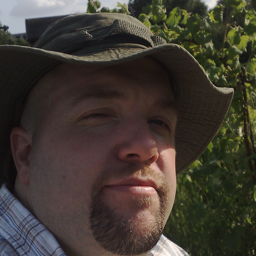

In [11]:
# Grabs the image paths from the dataset.
Image_Paths = [img for img in os.listdir(root_path)]
Image.open(os.path.join(root_path, Image_Paths[50128]))

findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

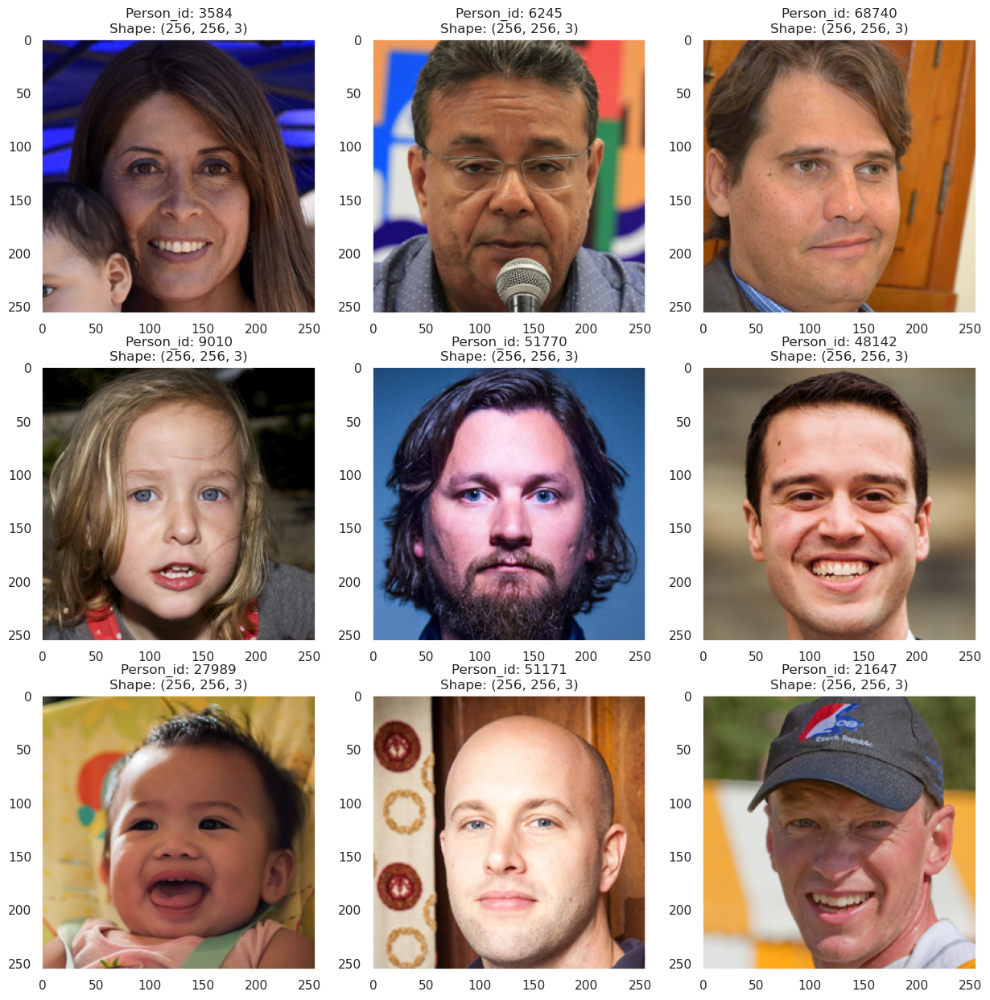

In [12]:
# Plots the Faces
fig = plot_random_persons(Image_Paths, sample = 9)

In [13]:
# Splits the data into the training and validation sets.
Directory = [path for path in os.listdir(root_path)]
rng = np.random.default_rng(seed)
indices = rng.permutation(len(Directory))
split_index = int(len(Directory) * 0.8)
train_indices = indices[:split_index]
val_indices = indices[split_index:]
train_indices.shape, val_indices.shape

((56000,), (14000,))

In [14]:
# Collects the Training and Validation Paths
Train_Paths = [Directory[index] for index in train_indices]
Val_Paths = [Directory[index] for index in val_indices]
Paths = Train_Paths.copy()
Paths.extend(Val_Paths)
np.shape(Train_Paths), np.shape(Val_Paths), np.shape(Paths)

((56000,), (14000,), (70000,))

In [15]:
# Generates the Training and Validation Datasets as well as their respective loaders.
print(PSNR_Ranges[-9][0], PSNR_Ranges[-1][1])
Train_Dataset = FacesDataset(root_dir = root_path, names = Train_Paths, minPSNR= PSNR_Ranges[-9][0] , maxPSNR = PSNR_Ranges[-1][1], augment = True, grayscale= GREYSCALE, virtSize = 512*Batch_Size, amplification_factor = 1e3)
Val_Dataset = FacesDataset(root_dir = root_path, names = Val_Paths, minPSNR= PSNR_Ranges[-9][0], maxPSNR = PSNR_Ranges[-1][1], augment = False, grayscale= GREYSCALE, virtSize = 128*Batch_Size, amplification_factor = 1e3)
Train_Loader = DataLoader(Train_Dataset, batch_size = Batch_Size, shuffle = True)
Validation_Loader = DataLoader(Val_Dataset, batch_size = Batch_Size, shuffle = False)
Train_Dataset.__len__(), Val_Dataset.__len__()

-40 32


(16384, 4096)

In [16]:
# Generates the Training and Validation Datasets as well as their respective loaders.
print(PSNR_Ranges[-9][0], PSNR_Ranges[-1][1])
Train_Dataset = FacesDataset(root_dir = root_path, names = Train_Paths, minPSNR= PSNR_Ranges[-9][0] , maxPSNR = PSNR_Ranges[-1][1], augment = True, grayscale= GREYSCALE, virtSize = 512*Batch_Size, amplification_factor = 1e3)
Val_Dataset = FacesDataset(root_dir = root_path, names = Val_Paths, minPSNR= PSNR_Ranges[-9][0], maxPSNR = PSNR_Ranges[-1][1], augment = False, grayscale= GREYSCALE, virtSize = 128*Batch_Size, amplification_factor = 1e3)
Train_Loader = DataLoader(Train_Dataset, batch_size = Batch_Size, shuffle = True)
Validation_Loader = DataLoader(Val_Dataset, batch_size = Batch_Size, shuffle = False)
Train_Dataset.__len__(), Val_Dataset.__len__()

-40 32


(16384, 4096)

findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.


findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

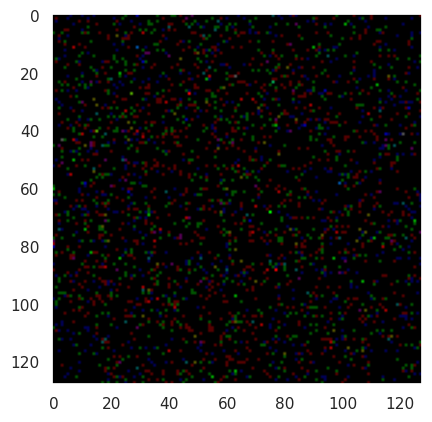

PSNR: -12.433809280395508
True PSNR: -8.05482610996352


In [17]:
# Grabs a sample image from the dataset and evaluates the PSNR.
ImageNoise, psnr_map, image_target = Train_Dataset.__getitem__(42)
ImageNoise = ImageNoise.detach().cpu().numpy().transpose(1,2,0)
image_target = image_target.detach().cpu().numpy().transpose(1,2,0)
normalised_noisy_image = ImageNoise/ImageNoise.mean()
normalised_image_target = image_target/image_target.mean()
true_psnr = psnr(normalised_image_target, normalised_noisy_image, data_range = normalised_image_target.max() - normalised_image_target.min())
normalised_image_target = (image_target - image_target.min())/(image_target.max() - image_target.min())
normalised_noisy_image = (ImageNoise - ImageNoise.min())/(ImageNoise.max() - ImageNoise.min())
plt.imshow(normalised_noisy_image)
plt.show()
print(f"PSNR: {psnr_map.min().detach().cpu().numpy()}")
print(f"True PSNR: {true_psnr}")

findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

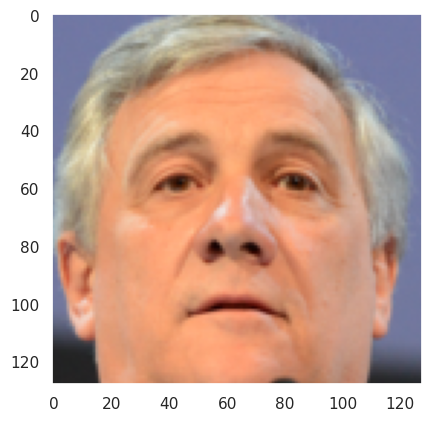

In [18]:
# Compares the original image with the noisy image.
plt.imshow(normalised_image_target)
plt.show()

In [19]:
# Grabs the Validation Paths for the Validation Noisy Images, PSNR Maps and Target Images.
Noisy_Images_Paths = []
Psnr_Maps_Paths = []
Image_Targets_Paths = []
with open(r"Validation_File_PathNames/NoisyImageNames.txt", "r") as File:  # Replace with the Dirctory Pathnames are stored in
    for line in File.readlines():
        Noisy_Images_Paths.append(line[:-1])
with open(r"Validation_File_PathNames/Psnr_MapNames.txt", "r") as File:
    for line in File.readlines():
        Psnr_Maps_Paths.append(line[:-1])
with open(r"Validation_File_PathNames/TargetImageNames.txt", "r") as File:
    for line in File.readlines():
        Image_Targets_Paths.append(line[:-1])
len(Noisy_Images_Paths), len(Psnr_Maps_Paths), len(Image_Targets_Paths)

(10, 10, 10)

In [20]:
# Generates dictionaries to store the Validation Noisy Images, PSNR Maps and Target Images.
Validation_Noisy_Images = {}
Validation_Psnr_Maps = {}
Validation_Target_Images = {}
val_Steps = 10
val_minpsnr = -40
val_maxpsnr = 40
val_Spacing = (val_maxpsnr - val_minpsnr) // val_Steps
val_psnr_ranges = [(i, j) for i, j in zip(range(val_minpsnr, val_maxpsnr, val_Spacing), range(val_minpsnr + val_Spacing, val_maxpsnr + val_Spacing, val_Spacing))]
print(len(val_psnr_ranges))
FaceValidators = [ValidationSetGenerator(root_dir= root_path, out_dir=out_dir, names = Paths, minPSNR= val_psnr_ranges[i][0], targetPSNR = val_psnr_ranges[i][1], augment= True, sample_size = 100, grayscale= GREYSCALE, amplification_factor= 1e2) for i in range(len(val_psnr_ranges))]
FaceValidators[0].out_dir
print(val_psnr_ranges)
for index in range(len(val_psnr_ranges)):
    psnr_label = str(val_psnr_ranges[index][0]) + str(val_psnr_ranges[index][1])
    print(f"Loading Validation Data for {index} Val_Dataset at psnr range {psnr_label}")
    FaceValidator = FaceValidators[index]
    File_Path_NI = Noisy_Images_Paths[index]
    File_Path_PSM = Psnr_Maps_Paths[index]
    File_Path_TI = Image_Targets_Paths[index]
    Noisy_Images, Psnr_Maps, Target_Images = FaceValidator.Load_Noisy_Faces(File_Path_NI, File_Path_PSM, File_Path_TI, device=device)
    Validation_Noisy_Images[psnr_label] = Noisy_Images
    Validation_Psnr_Maps[psnr_label] = Psnr_Maps
    Validation_Target_Images[psnr_label] = Target_Images
len(Validation_Noisy_Images), len(Validation_Psnr_Maps), len(Validation_Target_Images)

10
[(-40, -32), (-32, -24), (-24, -16), (-16, -8), (-8, 0), (0, 8), (8, 16), (16, 24), (24, 32), (32, 40)]
Loading Validation Data for 0 Val_Dataset at psnr range -40-32


/home/linux/KaylenGAP/MScGAPProject/PoissonValidator2.py:114: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  Noisy_Images = torch.load(file_path_NI)
/home/linux/KaylenGAP/MSc

Loading Validation Data for 1 Val_Dataset at psnr range -32-24
Loading Validation Data for 2 Val_Dataset at psnr range -24-16
Loading Validation Data for 3 Val_Dataset at psnr range -16-8
Loading Validation Data for 4 Val_Dataset at psnr range -80
Loading Validation Data for 5 Val_Dataset at psnr range 08
Loading Validation Data for 6 Val_Dataset at psnr range 816
Loading Validation Data for 7 Val_Dataset at psnr range 1624
Loading Validation Data for 8 Val_Dataset at psnr range 2432
Loading Validation Data for 9 Val_Dataset at psnr range 3240


(10, 10, 10)

In [21]:
# Outputs the different keys (Noise Ranges) in the Validation Noisy Images, PSNR Maps and Target Images.
Validation_Noisy_Images.keys()

dict_keys(['-40-32', '-32-24', '-24-16', '-16-8', '-80', '08', '816', '1624', '2432', '3240'])

In [22]:
# Generates a sample image from the Validation Noisy Images across different noise levels
# and evaluates the visualisation of the image.
ValidationNoisyTest_Batch = torch.zeros((len(Validation_Noisy_Images), 3, 128, 128))
ValidationPsnrTest_Batch = torch.zeros((len(Validation_Noisy_Images), 3, 128, 128))
ValidationTargetTest_Batch = torch.zeros((len(Validation_Noisy_Images), 3, 128, 128))
for index, key in enumerate(Validation_Noisy_Images.keys()):
    ValidationNoisyTest_Batch[index] = Validation_Noisy_Images[key][-10]
    ValidationPsnrTest_Batch[index] = Validation_Psnr_Maps[key][-10].view(1, 3, 128, 128)
    ValidationTargetTest_Batch[index] = Validation_Target_Images[key][-10]
ValidationNoisyTest_Batch.shape, ValidationPsnrTest_Batch.shape, ValidationTargetTest_Batch.shape

(torch.Size([10, 3, 128, 128]),
 torch.Size([10, 3, 128, 128]),
 torch.Size([10, 3, 128, 128]))

In [23]:
# Moves the validation data to the gpu
ValidationNoisyTest_Batch = ValidationNoisyTest_Batch.to(device)
ValidationPsnrTest_Batch = ValidationPsnrTest_Batch.to(device)
ValidationTargetTest_Batch = ValidationTargetTest_Batch.to(device)

In [26]:
#Counter = 0
#Sum_Faces = torch.zeros((1,3,128,128))
#for batch_idx, (ImageNoise, psnr_map, image_target) in enumerate(Train_Loader):
#   if batch_idx % 100 == 0:
#       print(batch_idx)
#   Sum_Faces += ImageNoise.sum(dim = 0, keepdim= True)
#   Counter += ImageNoise.shape[0]
#   if batch_idx == 1000:
#       break
#Average_Face = Sum_Faces/Counter
#Normalised_Average_Face = (Average_Face - Average_Face.min())/(Average_Face.max() - Average_Face.min())
#plt.imshow(Normalised_Average_Face.squeeze(0).permute(1,2,0).detach().cpu().numpy())
#plt.grid(False)
#plt.show()

/tmp/ipykernel_3784563/3707089627.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  Average_Face = torch.load(r"Data/Average_Face.pt")
findfont: Font family 'Times New Rom

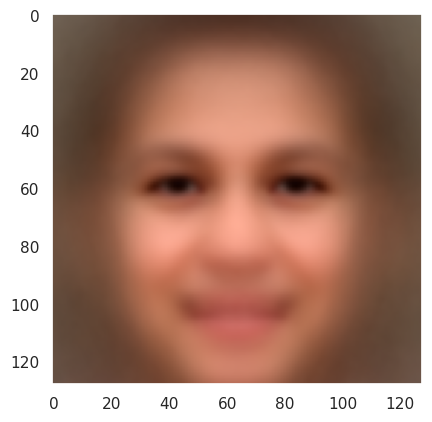

In [25]:
#torch.save(Average_Face, r"Data/Average_Face.pt")
Average_Face = torch.load(r"Data/Average_Face.pt")
Normalised_Average_Face = (Average_Face - Average_Face.min())/(Average_Face.max() - Average_Face.min())
plt.imshow(Normalised_Average_Face.squeeze(0).permute(1,2,0).detach().cpu().numpy())
plt.grid(False)
plt.show()

In [26]:
# Creates the directory to save the model in.
name = "FaceGenerationUNet128x128-m40-32"
CHECKPOINT_PATH = "./models/" 

In [37]:
# Loads the model from the checkpoint
model = UNet.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\OriginalGAPUNetCL.py:253: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
  init.xavier_normal(m.weight)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\OriginalGAPUNetCL.py:254: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)


In [39]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []
for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)
Psnr_Distribution_0 = np.array(Psnr_Distribution)
SSIM_Distribution_0 = np.array(SSIM_Distribution)
Perceptual_Distribution_0 = np.array(Perceptual_Distribution)
Psnr_Distribution_0.shape, SSIM_Distribution_0.shape, Perceptual_Distribution_0.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,22.946108,-3.559511,22.851904,1.419083,24.270986,21.432821
std,6.524294,20.564969,6.396547,0.340836,6.361009,6.449925
min,9.534812,-39.119021,13.076077,0.703284,14.475742,11.329538
25%,16.927605,-21.339266,16.770744,1.188115,18.092826,15.316895
50%,22.823743,-3.559511,22.721654,1.358948,24.025030,21.420345
75%,29.226769,14.220245,29.881936,1.612756,31.285603,28.237103
max,35.376661,32.000000,31.961869,2.553532,33.917736,30.955282


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.673632,-3.559511,0.670108,0.050748,0.720856,0.619359
std,0.217673,20.564969,0.211923,0.020682,0.194796,0.229635
min,0.185041,-39.119021,0.332490,0.009061,0.396513,0.252586
25%,0.477732,-21.339266,0.456092,0.034303,0.514691,0.390345
50%,0.705189,-3.559511,0.694195,0.052941,0.749749,0.638867
75%,0.886519,14.220245,0.885591,0.066979,0.920308,0.835858
max,0.971518,32.000000,0.950868,0.107478,0.990535,0.934394


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.465052,-3.119021,0.461664,0.055355,0.471579,0.451749
std,0.299528,20.310653,0.294188,0.028444,0.298115,0.290840
min,-0.052407,-38.238042,0.098707,0.010989,0.101214,0.093494
25%,0.132980,-20.678532,0.124758,0.033289,0.127995,0.120599
50%,0.619635,-3.119021,0.667601,0.053993,0.686700,0.654774
75%,0.735786,14.440489,0.716669,0.072825,0.727453,0.707677
max,0.914533,32.000000,0.824970,0.242917,0.836123,0.814135


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

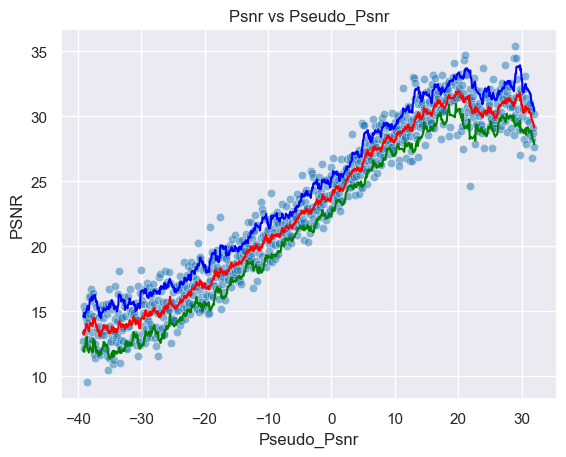

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

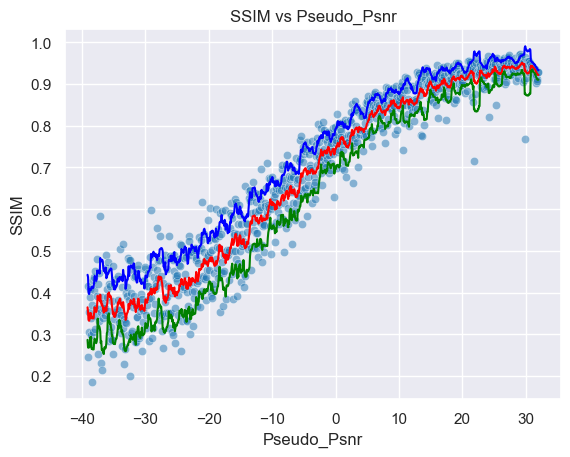

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

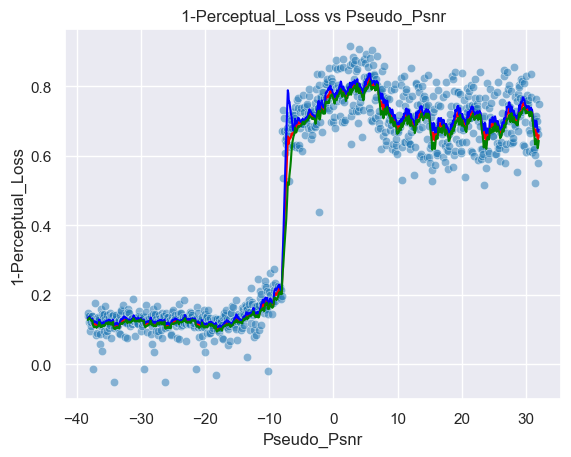

Psnr Area: 1625.3343218156792, SSIM Area: 47.65957568391943, Perceptual Area: 32.43177531425892
Mean Psnr 22.946107974973163
Std Psnr 6.524294312550647
Min Psnr 9.534811680980802
Max Psnr 35.37666074161767
Mean Roll Var 1.4190828863838074
Mean SSIM 0.6736319
Std SSIM 0.21767307817935944
Min SSIM 0.18504057824611664
Max SSIM 0.9715179800987244
Mean Roll SSIM 0.05074841963372095
Mean 1-PL 0.4650525
Std 1-PL 0.29952818155288696
Min 1-PL -0.05240678787231445
Max 1-PL 0.914533257484436
Mean Roll 1-PL 0.0553552430007652


(1625.3343218156792, 47.65957568391943, 32.43177531425892)

In [40]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the data.
Plot_Creater(Psnr_Distribution_0, SSIM_Distribution_0, Perceptual_Distribution_0, minpsnr, maxpsnr)

In [41]:
np.save("Psnr_Distribution_0.npy", Psnr_Distribution_0)
np.save("SSIM_Distribution_0.npy", SSIM_Distribution_0)
np.save("Perceptual_Distribution_0.npy", Perceptual_Distribution_0)

In [26]:
# Define the callbacks for the model training and validation.
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10, verbose=True, mode='min')
lr_monitor = LearningRateMonitor(logging_interval='step')
checkpoint_callback = ModelCheckpoint(monitor='val_loss', save_top_k=1, mode='min', verbose=True)

# Define the Residual-Learning GAP Model for the Face Generation. 
levels = 10
channels = 3
depth = 5
starting_filters = 42
up_mode = "upsample"
merge_mode = "concat"
num_layers = 2
dropout_rate = 0.25
warm_up_epochs = 10
epochs = max_epochs
learning_rate = 2e-4
mini_batches = 512
average_face = Average_Face
num_blocks_per_layer = 1
bottleneck = 64
from NoiseResidualUNet_Final import ResUNet
# Define the model
model = ResUNet(channels = channels, depth = depth, 
                starting_filters = starting_filters, up_mode = up_mode, merge_mode = merge_mode, 
                num_layers = num_layers, dropout_rate = dropout_rate, num_blocks_per_layer=num_blocks_per_layer,
                warm_up_epochs=warm_up_epochs, epochs = epochs, mini_batches=mini_batches,
                average_face=average_face).to(device)
model

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\NoiseResidualUNet_Final.py:405: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\NoiseResidualUNet_Final.py:407: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\NoiseResidualUNet_Final.py:410: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDrive\Documents

ResUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Block): Sequential(
        (0): Conv2d(37, 42, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(7, 42, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (Main_Processing_Block): Sequential(
        (0): Conv2d(42, 42, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(7, 42, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
        (3): Conv2d(42, 42, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): GroupNorm(7, 42, eps=1e-05, affine=True)
        (5): LeakyReLU(negative_slope=0.01)
      )
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (dropout): Dropout(p=0.25, inplace=False)
    )
    (1): DownConvolutionBlock(
      (activation): LeakyReLU(negative_sl

In [26]:
# Creates the directory to save the model in for the Third Highest PSNR Range.
name = "FaceGenerationRLUNet128x128-m40-32"
CHECKPOINT_PATH = "./models/" 

In [26]:
# Set the configuration 
hyperparameters = {
        "learning_rate": learning_rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size,
        "bottleneck":64
    }

NameError: name 'learning_rate' is not defined

In [29]:
# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

In [30]:
# Trains the Reisudal Learning model using the Pytorch Lightning Trainer. 
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=max_epochs,
                     logger= wandb_logger,
                     enable_checkpointing=False,
                     callbacks=[LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: kaylendarnbrook. Use `wandb login --relogin` to force relogin


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                  | Type       | Params
-----------------------------------------------------
0 | activation            | LeakyReLU  | 0     
1 | encoder               | ModuleList | 13.6 M
2 | decoder_intermediates | ModuleList | 12.1 K
3 | Bottleneck_Block      | ModuleList | 40.7 M
4 | decoder               | ModuleList | 22.9 M
5 | output                | Conv2d     | 129   
6 | ResidualNetwork       | Sequential | 27.3 K
-----------------------------------------------------
77.1 M    Trainable params
0         Non-trainable params
77.1 M    Total params
308.479   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


In [31]:
# Validates the trained model on the Train Set for the Residual Learning Model.
Trainer.test(model, Train_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:492: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.12602105736732483    │
│       test_mse_loss       │    0.07482554763555527    │
│     test_photon_loss      │   -0.12696324288845062    │
│         test_psnr         │     17.29705238342285     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.12602105736732483,
  'test_photon_loss': -0.12696324288845062,
  'test_mse_loss': 0.07482554763555527,
  'test_psnr': 17.29705238342285}]

In [32]:
# Validates the trained model on the Validation Set for the Residual Learning Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    -0.128799706697464     │
│       test_mse_loss       │    0.07651492953300476    │
│     test_photon_loss      │    -0.1299418956041336    │
│         test_psnr         │     17.25535774230957     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.128799706697464,
  'test_photon_loss': -0.1299418956041336,
  'test_mse_loss': 0.07651492953300476,
  'test_psnr': 17.25535774230957}]

In [60]:
# Loads the model from the checkpoint
from NoiseResidualUNet_Final import ResUNet
model = ResUNet.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\NoiseResidualUNet_Final.py:405: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\NoiseResidualUNet_Final.py:407: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\NoiseResidualUNet_Final.py:410: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDrive\Documents

In [26]:
# Evaluates the model on the Validation Set for the PSNR Range.
ImageNoise, psnr_map, image_target = Train_Dataset.__getitem__(42)
model = model.to(device)
model.eps.to(device)
model.eval()
ImageNoise = ImageNoise.to(device)/(ImageNoise.to(device).mean(dim = (-1,-2,-3), keepdim = True) + 1e-8)
Psnr_Maps = psnr_map.to(device)
Image_Target = image_target.to(device)
Log_Residual = model.forward(ImageNoise.unsqueeze(0).to(device), Psnr_Maps.unsqueeze(0).to(device)).detach()
Log_Residual-= Log_Residual.max()
Residual = torch.exp(Log_Residual)
print(Psnr_Maps.unsqueeze(0).shape, ImageNoise.unsqueeze(0).shape)
Prior = ImageNoise.unsqueeze(0)
print(Prior.shape)
Predictions = Prior + Residual
Predictions = ImageNoise.detach().cpu().numpy().sum() * Predictions/Predictions.sum()
Predictions.shape

torch.Size([1, 3, 128, 128]) torch.Size([1, 3, 128, 128])
torch.Size([1, 3, 128, 128])


torch.Size([1, 3, 128, 128])

In [27]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)

Psnr_Distribution_1 = np.array(Psnr_Distribution)
SSIM_Distribution_1 = np.array(SSIM_Distribution)
Perceptual_Distribution_1 = np.array(Perceptual_Distribution)

Psnr_Distribution_1.shape, SSIM_Distribution_1.shape, Perceptual_Distribution_1.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,2.878308,-3.559511,2.581103,1.661157,4.242261,0.919946
std,15.543606,20.564969,15.628207,0.442516,15.389514,15.875649
min,-35.375610,-39.119021,-31.614330,0.665285,-28.099152,-35.129508
25%,-10.280385,-21.339266,-10.658072,1.336523,-9.227301,-12.127136
50%,7.334318,-3.559511,6.740901,1.620300,8.409581,4.953948
75%,17.038448,14.220245,17.602759,1.993649,19.025890,16.132571
max,23.469222,32.000000,19.848949,3.569868,21.610169,18.210397


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.304079,-3.559511,0.300646,0.044701,0.345347,0.255945
std,0.243789,20.564969,0.236422,0.021158,0.245770,0.228655
min,0.008708,-39.119021,0.021374,0.010724,0.033535,0.009049
25%,0.106375,-21.339266,0.109490,0.028967,0.146025,0.076525
50%,0.218866,-3.559511,0.219344,0.043201,0.264666,0.171175
75%,0.521348,14.220245,0.500261,0.057612,0.589034,0.428926
max,0.843599,32.000000,0.771879,0.125676,0.806200,0.756958


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.209794,-3.119021,0.206979,0.067513,0.218923,0.195036
std,0.299976,20.310653,0.289292,0.033805,0.290879,0.287979
min,-0.342715,-38.238042,-0.182924,0.018263,-0.165043,-0.200804
25%,-0.050948,-20.678532,-0.064310,0.037191,-0.057537,-0.069136
50%,0.128195,-3.119021,0.137413,0.067182,0.143845,0.133542
75%,0.525962,14.440489,0.551342,0.086531,0.564981,0.536260
max,0.809740,32.000000,0.665161,0.206243,0.681550,0.660343


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

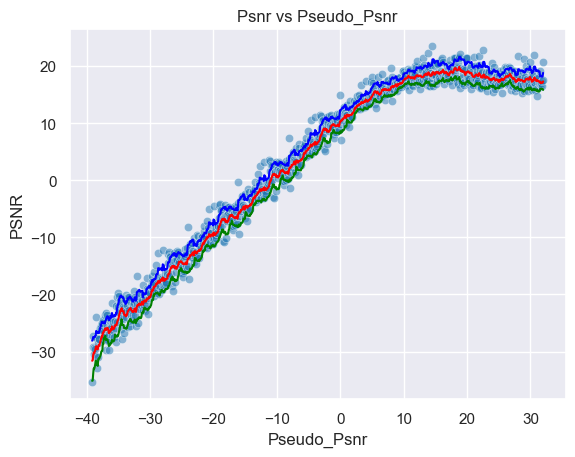

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

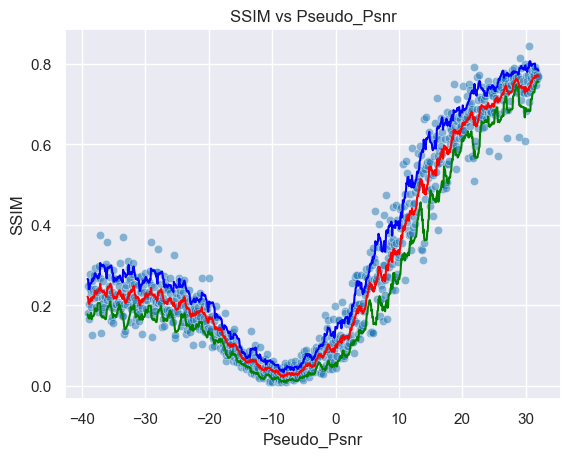

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

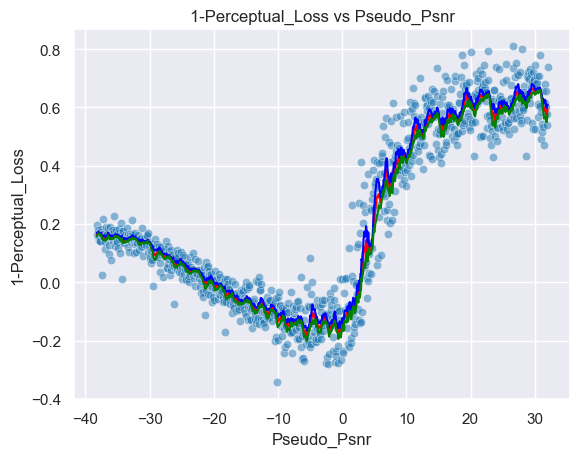

Psnr Area: 184.34523895182429, SSIM Area: 21.36603847978941, Perceptual Area: 14.52405434289949
Mean Psnr 2.878307696975131
Std Psnr 15.543605597821438
Min Psnr -35.375610311943845
Max Psnr 23.4692215621908
Mean Roll Var 1.6611572396603655
Mean SSIM 0.30407864
Std SSIM 0.2437886893749237
Min SSIM 0.008708293549716473
Max SSIM 0.8435985445976257
Mean Roll SSIM 0.044700728554069695
Mean 1-PL 0.20979431
Std 1-PL 0.2999764084815979
Min 1-PL -0.34271490573883057
Max 1-PL 0.8097400665283203
Mean Roll 1-PL 0.06751309926921047


(184.34523895182429, 21.36603847978941, 14.52405434289949)

In [28]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the data. 
Plot_Creater(Psnr_Distribution_1, SSIM_Distribution_1, Perceptual_Distribution_1, minpsnr, maxpsnr)

In [29]:
np.save("Psnr_Distribution_1.npy", Psnr_Distribution_1)
np.save("SSIM_Distribution_1.npy", SSIM_Distribution_1)
np.save("Perceptual_Distribution_1.npy", Perceptual_Distribution_1)

In [30]:
# Generates a sample image from the Validation Noisy Images across different noise levels
# and evaluates the visualisation of the image.
ValidationNoisyTest_Batch = torch.zeros((len(Validation_Noisy_Images), 3, 128, 128))
ValidationPsnrTest_Batch = torch.zeros((len(Validation_Noisy_Images), 3, 128, 128))
ValidationTargetTest_Batch = torch.zeros((len(Validation_Noisy_Images), 3, 128, 128))
for index, key in enumerate(Validation_Noisy_Images.keys()):
    ValidationNoisyTest_Batch[index] = Validation_Noisy_Images[key][-10]
    ValidationPsnrTest_Batch[index] = Validation_Psnr_Maps[key][-10].view(1, 3, 128, 128)
    ValidationTargetTest_Batch[index] = Validation_Target_Images[key][-10]
ValidationNoisyTest_Batch.shape, ValidationPsnrTest_Batch.shape, ValidationTargetTest_Batch.shape

(torch.Size([10, 3, 128, 128]),
 torch.Size([10, 3, 128, 128]),
 torch.Size([10, 3, 128, 128]))

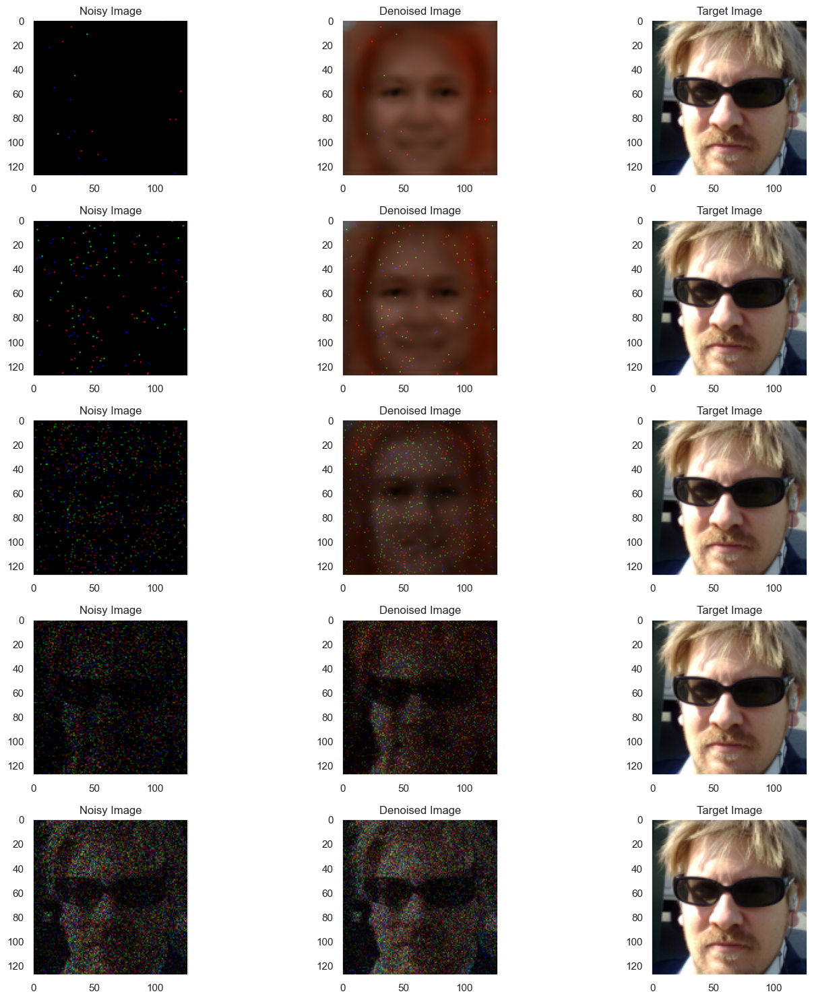

In [31]:
# Plots and visualises the sample Validation Noisy Image, Denoised Image and Target Image across the different noise levels.
Noisy_Images, Psnr_Maps, Image_Targets = ValidationNoisyTest_Batch.clone(), ValidationPsnrTest_Batch.clone(), ValidationTargetTest_Batch.clone()
Noisy_Images = Noisy_Images.to(device)
Psnr_Maps = Psnr_Maps.to(device)
Image_Targets = Image_Targets.to(device)
model = model.to(device)
model.eval()
with torch.no_grad():
    Denoised_Images = model(Noisy_Images, Psnr_Maps).detach().cpu().numpy()
    
Denoised_Images -= Denoised_Images.max(axis=(1,2,3), keepdims=True)
Denoised_Images = np.exp(Denoised_Images)
Denoised_Images = Noisy_Images.cpu().detach().numpy() + Denoised_Images
Denoised_Images = Noisy_Images.cpu().detach().numpy().sum() * Denoised_Images / Denoised_Images.sum(axis = (1,2,3), keepdims=True)
Denoised_Images = Denoised_Images.transpose(0,2,3,1)

Noisy_Images = Noisy_Images.cpu().detach().numpy().transpose(0,2,3,1)
Image_Targets = Image_Targets.cpu().detach().numpy().transpose(0,2,3,1)
Psnr_Maps = Psnr_Maps.cpu().detach().numpy().transpose(0,2,3,1)

Normalised_Noisy_Images = (Noisy_Images - Noisy_Images.min(axis = (1,2,3), keepdims=True))/(Noisy_Images.max(axis = (1,2,3), keepdims=True) - Noisy_Images.min(axis = (1,2,3), keepdims=True))
Normalised_Image_Targets = (Image_Targets - Image_Targets.min(axis = (1,2,3), keepdims=True))/(Image_Targets.max(axis = (1,2,3), keepdims=True) - Image_Targets.min(axis = (1,2,3), keepdims=True))
Normalised_Denoised_Images = (Denoised_Images - Denoised_Images.min(axis = (1,2,3), keepdims=True))/(Denoised_Images.max(axis = (1,2,3), keepdims=True) - Denoised_Images.min(axis = (1,2,3), keepdims=True))

plt.rcParams["axes.grid"] = False
Figure, Axes = plt.subplots(5, 3, figsize=(15,15))
for index in range(5):
    Axes[index, 0].imshow(Normalised_Noisy_Images[index])
    Axes[index, 0].set_title("Noisy Image")
    Axes[index, 1].imshow(Normalised_Denoised_Images[index])
    Axes[index, 1].set_title("Denoised Image")
    Axes[index, 2].imshow(Normalised_Image_Targets[index])
    Axes[index, 2].set_title("Target Image")
plt.tight_layout()
plt.grid(False)
plt.show()

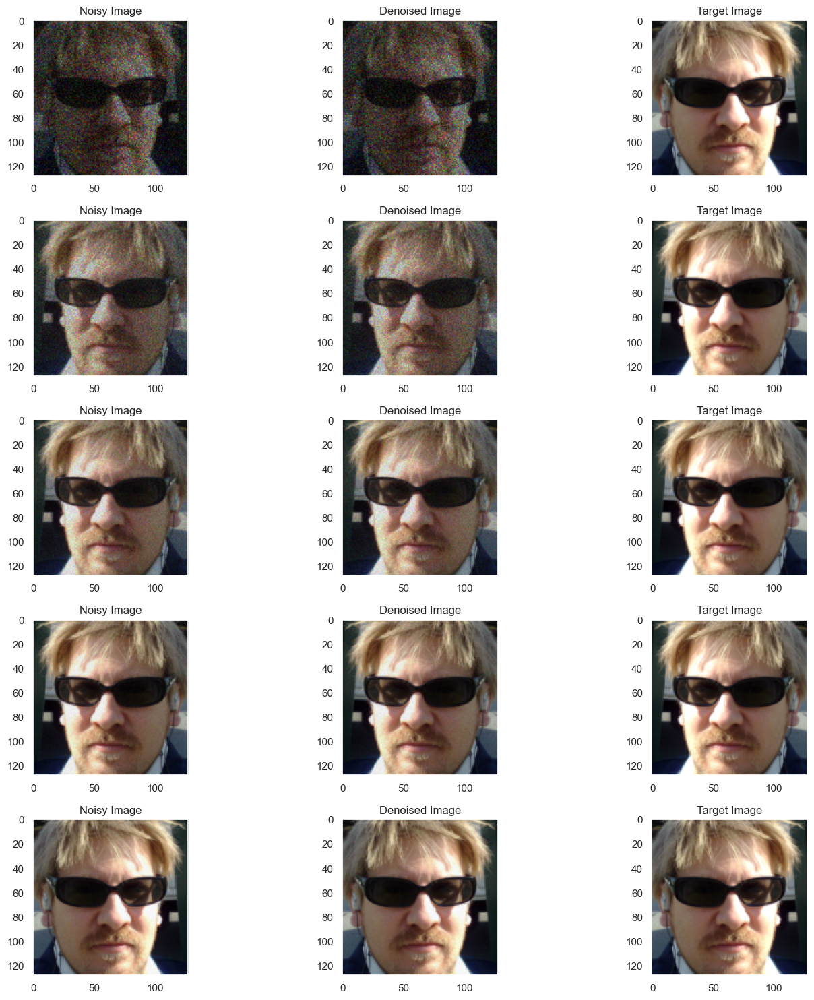

In [ ]:
# Continuation of above.
Figure, Axes = plt.subplots(5, 3, figsize=(15,15))
for index in range(5):
    actual_index = index + 5
    Axes[index, 0].imshow(Normalised_Noisy_Images[actual_index])
    Axes[index, 0].set_title("Noisy Image")
    Axes[index, 1].imshow(Normalised_Denoised_Images[actual_index])
    Axes[index, 1].set_title("Denoised Image")
    Axes[index, 2].imshow(Normalised_Image_Targets[actual_index])
    Axes[index, 2].set_title("Target Image")
plt.tight_layout()
plt.show()

In [32]:
np.save("Psnr_Distribution_1.npy", Psnr_Distribution_1)
np.save("SSIM_Distribution_1.npy", SSIM_Distribution_1)
np.save("Perceptual_Distribution_1.npy", Perceptual_Distribution_1)

In [30]:
# Create the U-net model
levels = 10
channels = 3
depth = 5
starting_filters = 50
up_mode = "upsample"
dropout_rate = 0.3
merge_mode = "concat"
Learning_Rate = 2e-4
Warm_Up_Epochs = 10
Epochs = max_epochs
mini_batches = 512
auxiliary_wight = 0.2
num_layers = 2
num_blocks_per_layer = 1
bottleneck = 64
weight_decay = 1e-5

# Create the Deep Supervision U-Net model for the Face Generation.
from DeepSupervisionUNet_Final_2 import DeepSupResUNet
model = DeepSupResUNet(channels = channels, depth = depth, 
                       starting_filters = starting_filters, up_mode = up_mode, 
                       dropout_rate = dropout_rate, merge_mode = merge_mode, 
                       num_layers = num_layers, 
                       num_blocks_per_layer = num_blocks_per_layer, 
                       warm_up_epochs = Warm_Up_Epochs, 
                       epochs = Epochs, mini_batches = mini_batches, 
                       auxiliary_weight = auxiliary_wight, 
                       weight_decay = weight_decay).to(device)
model

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DeepSupervisionUNet_Final_2.py:377: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DeepSupervisionUNet_Final_2.py:379: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DeepSupervisionUNet_Final_2.py:382: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDri

DeepSupResUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Block): Sequential(
        (0): Conv2d(30, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (Main_Processing_Block): Sequential(
        (0): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
        (3): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): GroupNorm(10, 50, eps=1e-05, affine=True)
        (5): LeakyReLU(negative_slope=0.01)
      )
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (dropout): Dropout(p=0.3, inplace=False)
    )
    (1): DownConvolutionBlock(
      (activation): LeakyReLU(ne

In [28]:
# Creates the directory to save the model in for the Deep-Supervision U-Net Model.
name = "FaceGenerationFinalDeepSupervisionUNet-m40-32"
CHECKPOINT_PATH = "./models/" 

In [32]:
# Set the configuration 
hyperparameters = {
        "learning_rate": Learning_Rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size
    }

In [33]:
# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

In [34]:
# Trains the model using the Pytorch Lightning Trainer for the Deep Supervision Model.
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator = "gpu", devices = [0],
                     max_epochs = max_epochs,
                     logger= wandb_logger,
                     enable_checkpointing=False,
                     callbacks=[#ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: kaylendarnbrook. Use `wandb login --relogin` to force relogin


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                     | Type       | Params
--------------------------------------------------------
0 | activation               | LeakyReLU  | 0     
1 | encoder                  | ModuleList | 19.2 M
2 | Down_Intermediates_Convs | ModuleList | 3.2 K 
3 | Up_Intermediates_Convs   | ModuleList | 3.2 K 
4 | Bottleneck_Block         | ModuleList | 57.6 M
5 | decoder                  | ModuleList | 32.4 M
6 | output                   | Conv2d     | 153   
--------------------------------------------------------
109 M     Trainable params
0         Non-trainable params
109 M     Total params
436.928   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


In [35]:
# Validations the trained model on the Train Set for the Deep Supervision Model.
Trainer.test(model, Train_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:492: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13359032571315765    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13359032571315765}]

In [36]:
# Validations the trained model on the Train Set for the Deep Supervision Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13242405652999878    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13242405652999878}]

In [29]:
# Load the Deep Supervision Model from the checkpoint.
from DeepSupervisionUNet_Final_2 import DeepSupResUNet
model = DeepSupResUNet.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DeepSupervisionUNet_Final_2.py:377: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DeepSupervisionUNet_Final_2.py:379: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DeepSupervisionUNet_Final_2.py:382: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDri

In [30]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end])[0].detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []

for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)

Psnr_Distribution_2 = np.array(Psnr_Distribution)
SSIM_Distribution_2 = np.array(SSIM_Distribution)
Perceptual_Distribution_2 = np.array(Perceptual_Distribution)

Psnr_Distribution_2.shape, SSIM_Distribution_2.shape, Perceptual_Distribution_2.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
0
1
2
3
4
-32-24
0
1
2
3
4
-24-16
0
1
2
3
4
-16-8
0
1
2
3
4
-80
0
1
2
3
4
08
0
1
2
3
4
816
0
1
2
3
4
1624
0
1
2
3
4
2432
0
1
2
3
4


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,23.196902,-3.559511,23.098074,1.567309,24.665383,21.530766
std,6.764814,20.564969,6.599134,0.479253,6.749501,6.480798
min,9.724292,-39.119021,13.091092,0.758063,14.403986,11.426526
25%,16.919825,-21.339266,16.909777,1.251224,18.258586,15.446634
50%,23.096846,-3.559511,22.931203,1.464774,24.302370,21.576273
75%,29.272358,14.220245,29.532958,1.797981,31.710612,27.846227
max,35.735242,32.000000,33.256693,3.525825,35.450575,32.333648


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.676026,-3.559511,0.672382,0.051494,0.723876,0.620888
std,0.224882,20.564969,0.218663,0.024431,0.203014,0.235809
min,0.195902,-39.119021,0.327028,0.007520,0.395374,0.257285
25%,0.476402,-21.339266,0.449985,0.028984,0.513917,0.383762
50%,0.693751,-3.559511,0.684053,0.054516,0.743067,0.622316
75%,0.902507,14.220245,0.890699,0.069351,0.926390,0.851684
max,0.975794,32.000000,0.961260,0.102641,1.024420,0.951610


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.453973,-3.119021,0.450513,0.054602,0.460436,0.440590
std,0.295352,20.310653,0.290403,0.021745,0.293890,0.287079
min,-0.053061,-38.238042,0.094946,0.010731,0.097896,0.089060
25%,0.129459,-20.678532,0.120869,0.036448,0.124617,0.116911
50%,0.589859,-3.119021,0.647106,0.057310,0.667793,0.625355
75%,0.729849,14.440489,0.710469,0.073537,0.721758,0.699116
max,0.921582,32.000000,0.851869,0.095086,0.863531,0.840623


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

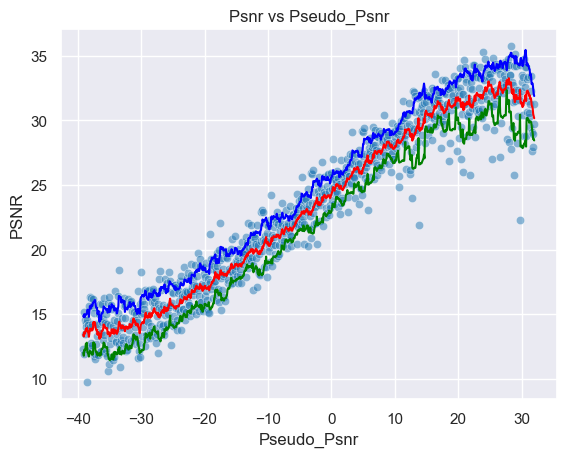

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

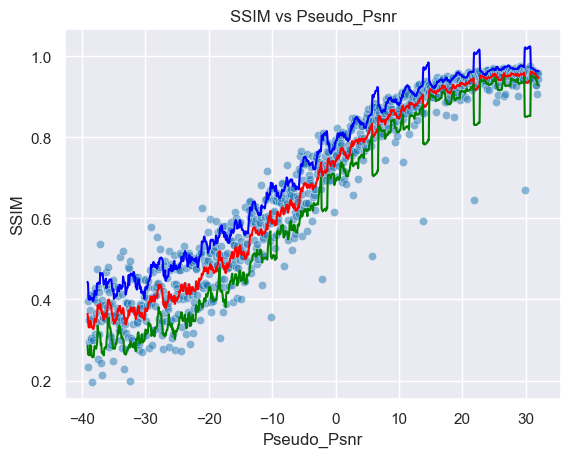

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

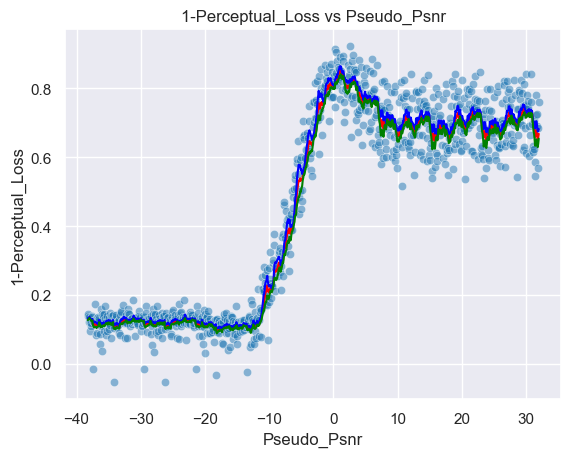

Psnr Area: 1642.8169436718792, SSIM Area: 47.82055021247291, Perceptual Area: 31.647313930632937
Mean Psnr 23.196901586992045
Std Psnr 6.7648141684037295
Min Psnr 9.724292416150908
Max Psnr 35.73524155232838
Mean Roll Var 1.5673086811164996
Mean SSIM 0.67602557
Std SSIM 0.22488246858119965
Min SSIM 0.19590222835540771
Max SSIM 0.9757936000823975
Mean Roll SSIM 0.05149392293003067
Mean 1-PL 0.45397326
Std 1-PL 0.2953522503376007
Min 1-PL -0.05306124687194824
Max 1-PL 0.9215816855430603
Mean Roll 1-PL 0.054602475860393074


(1642.8169436718792, 47.82055021247291, 31.647313930632937)

In [31]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the data.
Plot_Creater(Psnr_Distribution_2, SSIM_Distribution_2, Perceptual_Distribution_2, minpsnr, maxpsnr)

In [32]:
np.save("Psnr_Distribution_2.npy", Psnr_Distribution_2)
np.save("SSIM_Distribution_2.npy", SSIM_Distribution_2)
np.save("Perceptual_Distribution_2.npy", Perceptual_Distribution_2)

In [26]:
# Create the U-net model
levels = 10
channels = 3
depth = 5
starting_filters = 50
up_mode = "upsample"
dropout_rate = 0.3
merge_mode = "concat"
Learning_Rate = 2e-4
Warm_Up_Epochs = 10
Epochs = max_epochs
mini_batches = 512
auxiliary_wight = 0.2
num_layers = 2
num_blocks_per_layer = 1
bottleneck = 64
weight_decay = 1e-5
from GatedUNet_Final import GatedUNet
# Create the Gated U-Net model for the Face Generation.
model = GatedUNet(channels = channels, depth = depth, 
                       starting_filters = starting_filters, up_mode = up_mode, 
                       dropout_rate = dropout_rate, merge_mode = merge_mode, 
                       num_layers = num_layers, 
                       num_blocks_per_layer = num_blocks_per_layer, 
                       warm_up_epochs = Warm_Up_Epochs, 
                       epochs = Epochs, mini_batches = mini_batches, 
                       #auxiliary_weight = auxiliary_wight, 
                       weight_decay = weight_decay).to(device)
model

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\GatedUNet_Final.py:429: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\GatedUNet_Final.py:431: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\GatedUNet_Final.py:434: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projec

GatedUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Block): Sequential(
        (0): Conv2d(30, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (Main_Processing_Block): Sequential(
        (0): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
        (3): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): GroupNorm(10, 50, eps=1e-05, affine=True)
        (5): LeakyReLU(negative_slope=0.01)
      )
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (dropout): Dropout(p=0.3, inplace=False)
      (gated_convolution_gate): Gated_Convolution(
        (conv): Conv2d(

In [26]:
# Creates the directory to save the model in for the Gated U-Net Model.
name = "FaceGenerationFinalGatedResidualUNet-m40-32"
CHECKPOINT_PATH = "./models/" 

In [28]:
# Set the configuration 
hyperparameters = {
        "learning_rate": Learning_Rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size
    }

NameError: name 'Learning_Rate' is not defined

In [29]:
# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

In [30]:
# Trains the model using the Pytorch Lightning Trainer for the Gated U-Net Model.
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
           
                     max_epochs=max_epochs,
                     logger= wandb_logger,
                     enable_checkpointing=False,
                     callbacks=[#ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: kaylendarnbrook. Use `wandb login --relogin` to force relogin


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type       | Params
------------------------------------------------
0 | activation       | LeakyReLU  | 0     
1 | encoder          | ModuleList | 34.5 M
2 | Bottleneck_Block | ModuleList | 103 M 
3 | decoder          | ModuleList | 49.5 M
4 | output           | Conv2d     | 153   
------------------------------------------------
187 M     Trainable params
0         Non-trainable params
187 M     Total params
750.883   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


In [32]:
# Validates the trained model on the Train Set for the Gated U-Net Model.
Trainer.test(model, Train_Loader)

NameError: name 'Trainer' is not defined

In [32]:
# Validates the trained model on the Validation Set for the Gated U-Net Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13384978473186493    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13384978473186493}]

In [29]:
# Loads the model from the checkpoint
from GatedUNet_Final import GatedUNet
name = "FaceGenerationFinalGatedResidualUNet-m40-32"
CHECKPOINT_PATH = "./models/" 
model = GatedUNet.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\GatedUNet_Final.py:429: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\GatedUNet_Final.py:431: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\GatedUNet_Final.py:434: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projec

In [34]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []
for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)
Psnr_Distribution_3 = np.array(Psnr_Distribution)
SSIM_Distribution_3 = np.array(SSIM_Distribution)
Perceptual_Distribution_3 = np.array(Perceptual_Distribution)
Psnr_Distribution_3.shape, SSIM_Distribution_3.shape, Perceptual_Distribution_3.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,23.569472,-3.559511,23.459406,1.492841,24.952247,21.966566
std,7.168164,20.564969,7.025836,0.389961,7.127890,6.944211
min,9.774612,-39.119021,13.040046,0.721669,14.447191,11.461471
25%,16.946148,-21.339266,16.848304,1.218024,18.092827,15.462646
50%,23.265221,-3.559511,23.092359,1.415942,24.443295,21.782020
75%,30.142640,14.220245,30.400547,1.752008,32.294447,28.611105
max,37.194849,32.000000,34.444812,2.754409,36.350691,33.330967


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.679814,-3.559511,0.676107,0.050454,0.726561,0.625654
std,0.228414,20.564969,0.222519,0.024198,0.206062,0.240289
min,0.190596,-39.119021,0.332764,0.007388,0.398557,0.254453
25%,0.470673,-21.339266,0.444083,0.026334,0.506320,0.381759
50%,0.703317,-3.559511,0.692575,0.054109,0.756951,0.635370
75%,0.907557,14.220245,0.900628,0.069323,0.935220,0.858454
max,0.978228,32.000000,0.965951,0.101672,1.017566,0.956989


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.465102,-3.119021,0.461605,0.055102,0.471556,0.451653
std,0.298613,20.310653,0.293291,0.027629,0.297150,0.290070
min,-0.052602,-38.238042,0.098658,0.010925,0.101562,0.092510
25%,0.133508,-20.678532,0.124796,0.035443,0.128044,0.121084
50%,0.624311,-3.119021,0.675245,0.054387,0.689773,0.661185
75%,0.727471,14.440489,0.720955,0.072152,0.732462,0.710376
max,0.918780,32.000000,0.827067,0.251285,0.839865,0.820968


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

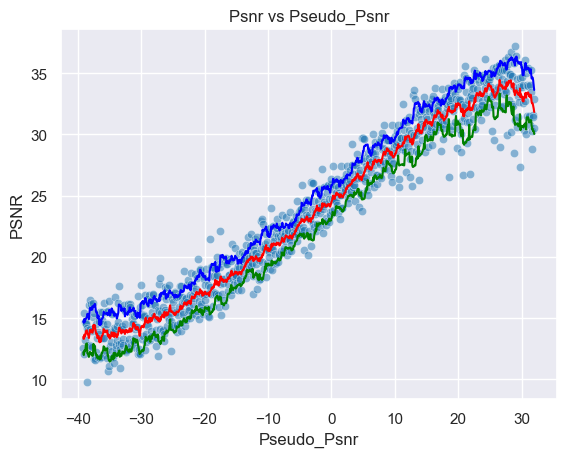

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

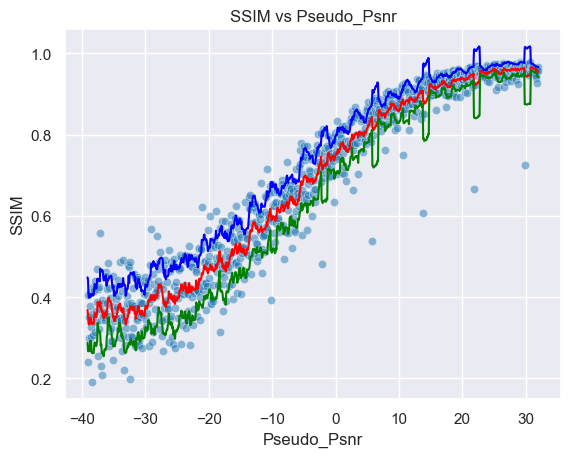

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

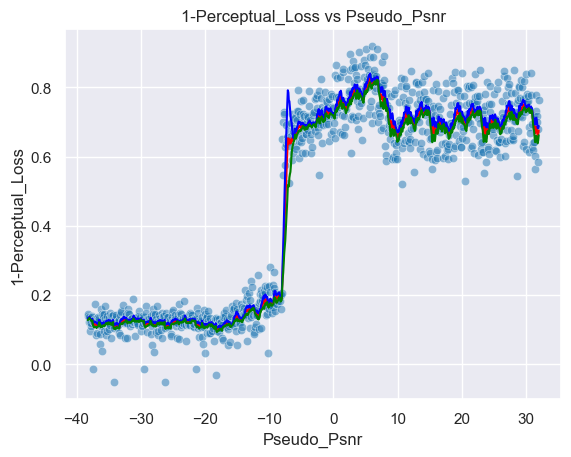

Psnr Area: 1668.474388657763, SSIM Area: 48.08528565291369, Perceptual Area: 32.426949309560165
Mean Psnr 23.569471689440096
Std Psnr 7.168164442655895
Min Psnr 9.774611973751753
Max Psnr 37.1948489386378
Mean Roll Var 1.4928407821141059
Mean SSIM 0.67981356
Std SSIM 0.22841395437717438
Min SSIM 0.1905955672264099
Max SSIM 0.9782283902168274
Mean Roll SSIM 0.050453505752028394
Mean 1-PL 0.46510172
Std 1-PL 0.2986127436161041
Min 1-PL -0.05260157585144043
Max 1-PL 0.9187799692153931
Mean Roll 1-PL 0.05510206103574653


(1668.474388657763, 48.08528565291369, 32.426949309560165)

In [35]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the data.
Plot_Creater(Psnr_Distribution_3, SSIM_Distribution_3, Perceptual_Distribution_3, minpsnr, maxpsnr)

In [36]:
np.save("Psnr_Distribution_3.npy", Psnr_Distribution_3)
np.save("SSIM_Distribution_3.npy", SSIM_Distribution_3)
np.save("Perceptual_Distribution_3.npy", Perceptual_Distribution_3)

In [26]:

# Create the U-net model
levels = 10
channels = 3
depth = 5
starting_filters = 50
up_mode = "upsample"
dropout_rate = 0.3
merge_mode = "concat"
Learning_Rate = 2e-4
epochs = max_epochs
mini_batches = 512
auxiliary_wight = 0.2
num_layers = 2
mini_batches = 512
maxpsnr = 32
minpsnr = -40
concatenate = True
num_timesteps = 100
initial_channels = 4
time_channels = initial_channels*4
weight_decay = 1e-5
num_blocks_per_layer = 1
warm_up_epochs = 10


# Creates the directory to save the model in for the PSNR UNet Model. 
from PSNRUNet_Final_2 import ResUNet
model = ResUNet(levels = levels,
                channels = channels,
                initial_channels = initial_channels,
                depth = depth,
                starting_filters=starting_filters,
                dropout_rate=dropout_rate,
                up_mode=up_mode,
                merge_mode=merge_mode,
                num_layers=num_layers,
                num_blocks_per_layer= num_blocks_per_layer,
                mini_batches=mini_batches,
                warm_up_epochs=warm_up_epochs,
                epochs = epochs,
                concatenate=concatenate,
                maxpsnr=maxpsnr,
                minpsnr=minpsnr,
                num_timesteps=num_timesteps,
                time_channels=time_channels).to(device)
model

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\PSNRUNet_Final_2.py:480: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\PSNRUNet_Final_2.py:482: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\PSNRUNet_Final_2.py:467: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\k

ResUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (Temporal_Embedding): Temporal_Embedder(
    (Linear_1): Linear(in_features=4, out_features=16, bias=True)
    (Linear_2): Linear(in_features=16, out_features=16, bias=True)
  )
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Block): Sequential(
        (0): Conv2d(30, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (Main_Processing_Block): Sequential(
        (0): Conv2d(51, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
        (3): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): GroupNorm(10, 50, eps=1e-05, affine=True)
        (5): LeakyReLU(negative_slope=0.01)
      )
      (pool): MaxPool2d(kernel_s

In [26]:
# Creates the directory to save the model in PSNR-UNet.
name = "FaceGenerationFinalPsnrResidualUNet-m40-32"
CHECKPOINT_PATH = "./models/" 

In [28]:
# Set the configuration 
hyperparameters = {
        "learning_rate": Learning_Rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size
    }

In [29]:
# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

In [30]:
# Plots for a sample image the Noisy Image, its corresponding denoised image
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=max_epochs,
                     logger= wandb_logger,
                     enable_checkpointing=False,
                     callbacks=[#ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: kaylendarnbrook. Use `wandb login --relogin` to force relogin


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name               | Type              | Params
---------------------------------------------------------
0 | activation         | LeakyReLU         | 0     
1 | Temporal_Embedding | Temporal_Embedder | 352   
2 | encoder            | ModuleList        | 19.2 M
3 | Bottleneck_Block   | ModuleList        | 57.6 M
4 | decoder            | ModuleList        | 32.4 M
5 | output             | Conv2d            | 153   
---------------------------------------------------------
109 M     Trainable params
0         Non-trainable params
109 M     Total params
437.074   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


In [31]:
# Validates the trained model on the Train Set for the PSNR-UNet Model.
Trainer.test(model, Train_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:492: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13352768123149872    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13352768123149872}]

: 

In [31]:
# Validates the trained model on the Validation Set for the PSNR-UNet Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13361428678035736    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13361428678035736}]

In [27]:
# Create the U-net model
from PSNRUNet_Final_2 import ResUNet
model = ResUNet.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')
model

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\PSNRUNet_Final_2.py:480: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\PSNRUNet_Final_2.py:482: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\PSNRUNet_Final_2.py:467: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\k

ResUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (Temporal_Embedding): Temporal_Embedder(
    (Linear_1): Linear(in_features=4, out_features=16, bias=True)
    (Linear_2): Linear(in_features=16, out_features=16, bias=True)
  )
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Block): Sequential(
        (0): Conv2d(30, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (Main_Processing_Block): Sequential(
        (0): Conv2d(51, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
        (3): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): GroupNorm(10, 50, eps=1e-05, affine=True)
        (5): LeakyReLU(negative_slope=0.01)
      )
      (pool): MaxPool2d(kernel_s

In [28]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end], Psnr_Maps[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)
    
Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []
for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)
Psnr_Distribution_4 = np.array(Psnr_Distribution)
SSIM_Distribution_4 = np.array(SSIM_Distribution)
Perceptual_Distribution_4 = np.array(Perceptual_Distribution)
Psnr_Distribution_4.shape, SSIM_Distribution_4.shape, Perceptual_Distribution_4.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,21.852298,-3.559511,21.767994,1.442007,23.210002,20.325987
std,5.513979,20.564969,5.344056,0.396226,5.341442,5.375952
min,9.746337,-39.119021,13.065446,0.560451,14.483744,11.326707
25%,16.888652,-21.339266,16.741760,1.143427,18.027157,15.249524
50%,22.409334,-3.559511,22.351276,1.380986,23.691387,21.031498
75%,26.937987,14.220245,27.084986,1.700733,28.793766,25.360651
max,31.274841,32.000000,28.961516,2.606781,30.935527,28.066191


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.579948,-3.559511,0.576852,0.058690,0.635542,0.518161
std,0.199062,20.564969,0.189575,0.026514,0.189566,0.193257
min,0.162928,-39.119021,0.283175,0.019833,0.337964,0.224411
25%,0.393692,-21.339266,0.381900,0.044616,0.437829,0.315833
50%,0.597067,-3.559511,0.586868,0.053291,0.643412,0.520641
75%,0.773079,14.220245,0.765650,0.063664,0.827530,0.702825
max,0.894676,32.000000,0.845707,0.157816,0.955891,0.825874


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.441282,-3.119021,0.438057,0.055986,0.448333,0.427782
std,0.274932,20.310653,0.268841,0.028194,0.273071,0.265203
min,-0.052615,-38.238042,0.099258,0.010894,0.101902,0.093733
25%,0.135561,-20.678532,0.125070,0.035702,0.128339,0.121481
50%,0.586563,-3.119021,0.638701,0.056742,0.653366,0.624952
75%,0.687291,14.440489,0.677875,0.071748,0.689901,0.666593
max,0.865831,32.000000,0.764189,0.231911,0.777079,0.752775


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

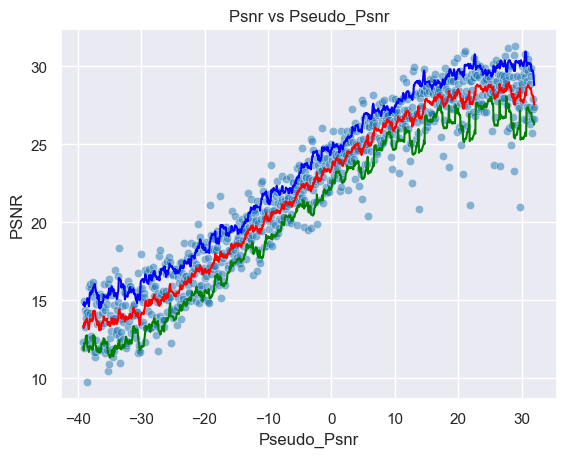

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

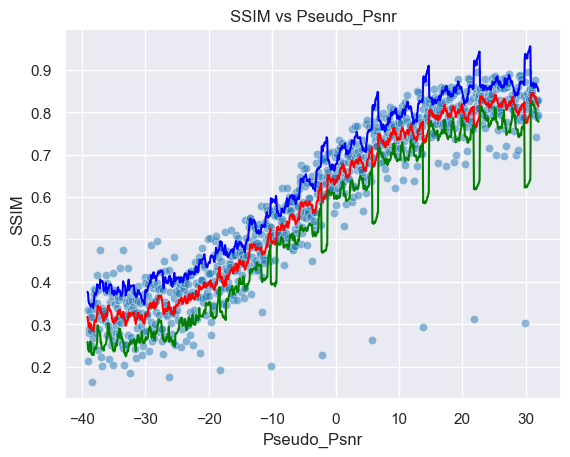

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

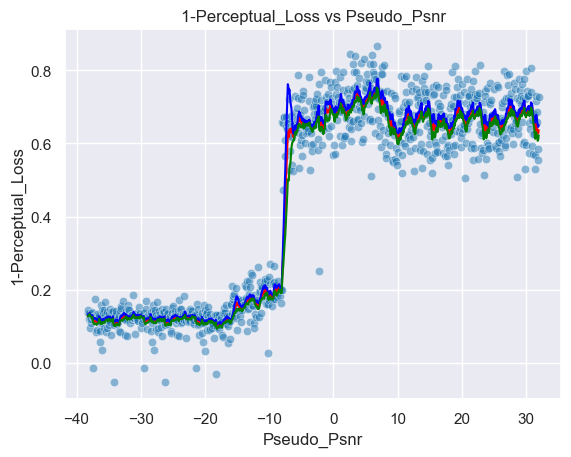

Psnr Area: 1548.2241109173483, SSIM Area: 41.02603649199672, Perceptual Area: 30.772679357361607
Mean Psnr 21.85229810292251
Std Psnr 5.513978556056181
Min Psnr 9.746336949876175
Max Psnr 31.274841031381282
Mean Roll Var 1.4420074100293747
Mean SSIM 0.57994753
Std SSIM 0.19906188547611237
Min SSIM 0.16292814910411835
Max SSIM 0.8946759700775146
Mean Roll SSIM 0.05869033749408281
Mean 1-PL 0.4412818
Std 1-PL 0.27493202686309814
Min 1-PL -0.05261528491973877
Max 1-PL 0.8658311367034912
Mean Roll 1-PL 0.05598572384177358


(1548.2241109173483, 41.02603649199672, 30.772679357361607)

In [29]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the Fourth Highest PSNR Range.
Plot_Creater(Psnr_Distribution_4, SSIM_Distribution_4, Perceptual_Distribution_4, minpsnr, maxpsnr)

In [30]:
np.save("Psnr_Distribution_4.npy", Psnr_Distribution_4)
np.save("SSIM_Distribution_4.npy", SSIM_Distribution_4)
np.save("Perceptual_Distribution_4.npy", Perceptual_Distribution_4)

In [26]:
# Create the U-net model
levels = 10
channels = 3
up_mode = "upsample"
merge_mode = "concat"
num_layers = 2
dropout_rate = 0.2
learning_rate= 1e-3
weight_decay  = 1e-4
starting_filters = 35
num_blocks_per_layer = 1
mini_batches = 512
warm_up_epochs = 10
depth = 5
epochs = 30
dilation_mode = True

# Create the Hybrid Dilated Residual U-Net model for the Face Generation.
from HybridDilatedResidualUnet_Final2 import HybridDilatedResUNet
model  = HybridDilatedResUNet(
                levels = levels,
                channels = channels,
                up_mode = up_mode,
                num_layers = num_layers,
                dropout_rate = dropout_rate,
                learning_rate = learning_rate,
                weight_decay = weight_decay,
                starting_filters = starting_filters,
                num_blocks_per_layer = num_blocks_per_layer,
                mini_batches = mini_batches,
                warm_up_epochs = warm_up_epochs,
                epochs = epochs,
                dilation_mode = dilation_mode,
                depth=depth).to(device)

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\HybridDilatedResidualUnet_Final2.py:411: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\HybridDilatedResidualUnet_Final2.py:413: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\HybridDilatedResidualUnet_Final2.py:416: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Use

In [26]:
# Creates the directory to save the model in for the Hybrid Dilated Residual U-Net Model.
name = "FaceGenerationFinalHybridDilatedUNet-m40-32"
CHECKPOINT_PATH = "./models/" 

In [28]:
# Set the configuration 
hyperparameters = {
        "learning_rate": learning_rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size
    }

In [29]:
# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

In [30]:
# Trains the model using the Pytorch Lightning Trainer for the Fifth Highest PSNR Range.
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=max_epochs,
                     logger= wandb_logger,
                     enable_checkpointing=False,
                     callbacks=[#ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: kaylendarnbrook. Use `wandb login --relogin` to force relogin


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type       | Params
------------------------------------------------
0 | activation       | LeakyReLU  | 0     
1 | encoder          | ModuleList | 25.7 M
2 | Bottleneck_Block | ModuleList | 77.2 M
3 | decoder          | ModuleList | 63.1 M
4 | output           | Conv2d     | 108   
------------------------------------------------
165 M     Trainable params
0         Non-trainable params
165 M     Total params
663.884   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


In [31]:
# Validates the trained model on the Train Set for the Hybrid Dilated Residual U-Net Model.
Trainer.test(model, Train_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:492: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13327430188655853    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13327430188655853}]

In [32]:
# Validates the trained model on the Train Set for the Hybrid Dilated Residual U-Net Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    -0.1336057037115097    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.1336057037115097}]

In [27]:
# Validates the trained model on the Train Set for the Hybrid Dilated Residual U-Net Model 
from HybridDilatedResidualUnet_Final2 import HybridDilatedResUNet
model = HybridDilatedResUNet.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\HybridDilatedResidualUnet_Final2.py:411: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\HybridDilatedResidualUnet_Final2.py:413: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\HybridDilatedResidualUnet_Final2.py:416: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Use

In [28]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []
for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)
Psnr_Distribution_5 = np.array(Psnr_Distribution)
SSIM_Distribution_5 = np.array(SSIM_Distribution)
Perceptual_Distribution_5 = np.array(Perceptual_Distribution)
Psnr_Distribution_5.shape, SSIM_Distribution_5.shape, Perceptual_Distribution_5.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,21.646641,-3.559511,21.565880,1.602906,23.168786,19.962974
std,5.381622,20.564969,5.153702,0.525781,5.304024,5.053862
min,9.600664,-39.119021,12.992201,0.722278,14.303113,11.362760
25%,16.814223,-21.339266,16.733807,1.230583,18.076487,15.243188
50%,22.075679,-3.559511,22.246887,1.487565,23.655424,20.691061
75%,26.654884,14.220245,26.679738,1.837665,28.731335,24.584217
max,31.212461,32.000000,28.759909,3.540039,31.329739,27.688905


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.587931,-3.559511,0.584935,0.058562,0.643497,0.526373
std,0.198692,20.564969,0.189257,0.026929,0.187721,0.194544
min,0.166582,-39.119021,0.297956,0.017584,0.355059,0.229491
25%,0.402365,-21.339266,0.393937,0.044375,0.447121,0.322119
50%,0.604191,-3.559511,0.597028,0.052476,0.655197,0.528805
75%,0.779194,14.220245,0.773830,0.063491,0.831691,0.719494
max,0.894232,32.000000,0.850948,0.160077,0.957717,0.826381


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.437510,-3.119021,0.434308,0.057555,0.445096,0.423521
std,0.273041,20.310653,0.266372,0.030209,0.271115,0.262231
min,-0.052646,-38.238042,0.099401,0.010928,0.102043,0.093334
25%,0.134995,-20.678532,0.124973,0.036185,0.128323,0.121391
50%,0.580639,-3.119021,0.634754,0.058020,0.648793,0.618216
75%,0.681015,14.440489,0.671407,0.072412,0.683824,0.659769
max,0.865962,32.000000,0.763459,0.234493,0.782880,0.747202


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

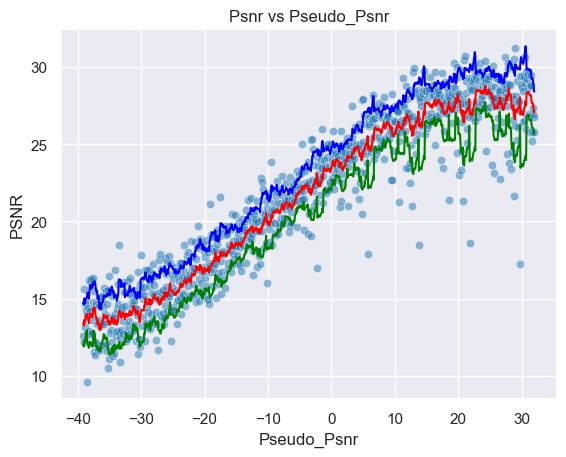

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

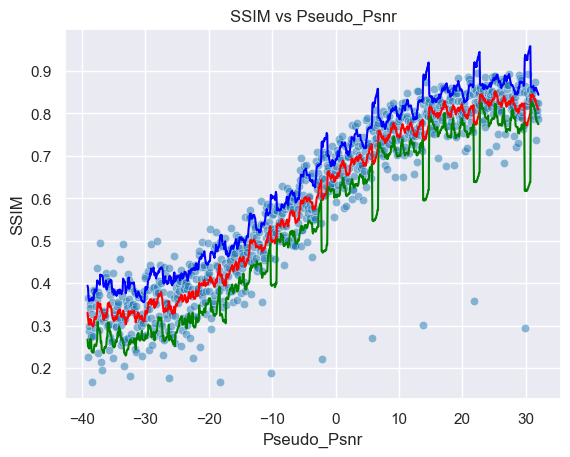

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

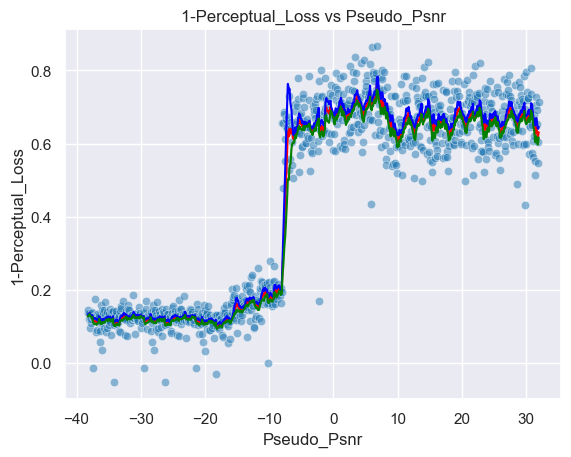

Psnr Area: 1533.8512538340342, SSIM Area: 41.601218468206085, Perceptual Area: 30.50927269902988
Mean Psnr 21.64664116516387
Std Psnr 5.381622434291186
Min Psnr 9.600663560810235
Max Psnr 31.212460545883655
Mean Roll Var 1.6029060903071388
Mean SSIM 0.58793116
Std SSIM 0.1986919492483139
Min SSIM 0.16658194363117218
Max SSIM 0.8942322731018066
Mean Roll SSIM 0.058562005018509805
Mean 1-PL 0.4375099
Std 1-PL 0.2730405330657959
Min 1-PL -0.05264627933502197
Max 1-PL 0.8659617900848389
Mean Roll 1-PL 0.057555149542753356


(1533.8512538340342, 41.601218468206085, 30.50927269902988)

In [29]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the Hybrid Dilated Residual U-Net Model.
Plot_Creater(Psnr_Distribution_5, SSIM_Distribution_5, Perceptual_Distribution_5, minpsnr, maxpsnr)

In [30]:
np.save("Psnr_Distribution_5.npy", Psnr_Distribution_5)
np.save("SSIM_Distribution_5.npy", SSIM_Distribution_5)
np.save("Perceptual_Distribution_5.npy", Perceptual_Distribution_5)

In [26]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the Adaptive U-Net Model.
name = "FaceGenerationFinalAdaptiveUNet-m40-32"
CHECKPOINT_PATH = "./models/" 

In [27]:

# Create the U-net model 
levels = 10
channels = 3
up_mode = "upsample"
merge_mode = "concat"
num_layers = 2
dropout_rate = 0.2
learning_rate= 2e-4
weight_decay  = 1e-4
starting_filters = 50
num_blocks_per_layer = 1
mini_batches = 512
warm_up_epochs = 10
epochs = 30
depth = 5
film_enabled = True
adain_enabled = True

# Adaptive U-Net Model for the Face Generation.
from AdaptiveResidualUNet_Final2 import AdaptiveResUNet
model  = AdaptiveResUNet(
                levels = levels,
                channels = channels,
                up_mode = up_mode,
                depth = depth,
                num_layers = num_layers,
                dropout_rate = dropout_rate,
                learning_rate = learning_rate,
                weight_decay = weight_decay,
                starting_filters = starting_filters,
                num_blocks_per_layer = num_blocks_per_layer,
                mini_batches = mini_batches,
                warm_up_epochs = warm_up_epochs,
                epochs = epochs,
                adain_enabled=adain_enabled,
                film_enabled=film_enabled).to(device)
model

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\AdaptiveResidualUNet_Final2.py:537: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\AdaptiveResidualUNet_Final2.py:539: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\AdaptiveResidualUNet_Final2.py:529: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDri

AdaptiveResUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (NoiseEmbedder): NoiseEmbedder(
    (dense): Linear(in_features=1, out_features=16, bias=True)
    (dense_2): Linear(in_features=16, out_features=64, bias=True)
    (norm): GroupNorm(4, 16, eps=1e-05, affine=True)
    (norm_2): GroupNorm(16, 64, eps=1e-05, affine=True)
    (dropout): Dropout(p=0.2, inplace=False)
  )
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Block): Sequential(
        (0): Conv2d(30, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (Main_Processing_Block): Sequential(
        (0): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
        (3): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), paddin

In [28]:
# Set the configuration 
hyperparameters = {
        "learning_rate": learning_rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size
    }

In [29]:
# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

In [30]:
# Trains the model using the Pytorch Lightning Trainer for the Adaptive U-Net Model.
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=max_epochs,
                     logger= wandb_logger,
                     enable_checkpointing=False,
                     callbacks=[#ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: kaylendarnbrook. Use `wandb login --relogin` to force relogin


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type          | Params
---------------------------------------------------
0 | activation       | LeakyReLU     | 0     
1 | NoiseEmbedder    | NoiseEmbedder | 1.3 K 
2 | encoder          | ModuleList    | 19.6 M
3 | Bottleneck_Block | ModuleList    | 58.0 M
4 | decoder          | ModuleList    | 32.8 M
5 | output           | Conv2d        | 153   
---------------------------------------------------
110 M     Trainable params
0         Non-trainable params
110 M     Total params
441.796   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


In [31]:
# Validates the trained model on the Train Set for the Adaptive U-Net Model.
Trainer.test(model, Train_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:492: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13269799947738647    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13269799947738647}]

In [32]:
# Validates the trained model on the Validation Set for the Adaptive U-Net Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13336074352264404    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13336074352264404}]

In [33]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end], Psnr_Maps[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []
for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)
Psnr_Distribution_6 = np.array(Psnr_Distribution)
SSIM_Distribution_6 = np.array(SSIM_Distribution)
Perceptual_Distribution_6 = np.array(Perceptual_Distribution)
Psnr_Distribution_6.shape, SSIM_Distribution_6.shape, Perceptual_Distribution_6.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,21.664076,-3.559511,21.589271,1.615422,23.204693,19.973849
std,5.376225,20.564969,5.146588,0.550681,5.298568,5.050388
min,9.705303,-39.119021,13.053174,0.755522,14.380748,11.327228
25%,16.831363,-21.339266,16.759101,1.229143,18.051275,15.317269
50%,22.008827,-3.559511,22.236372,1.478743,23.524873,20.717789
75%,26.666873,14.220245,26.685614,1.852960,28.854139,24.667599
max,31.086852,32.000000,28.509971,3.691527,31.015947,27.606418


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.589074,-3.559511,0.586164,0.058067,0.644231,0.528098
std,0.196225,20.564969,0.186926,0.026588,0.185448,0.192108
min,0.176394,-39.119021,0.299177,0.016364,0.355922,0.234791
25%,0.405598,-21.339266,0.394473,0.043786,0.451073,0.328712
50%,0.605154,-3.559511,0.596157,0.053347,0.653612,0.532602
75%,0.781577,14.220245,0.775231,0.063055,0.834608,0.719369
max,0.893244,32.000000,0.847586,0.156386,0.948599,0.823291


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.433201,-3.119021,0.430136,0.056622,0.440618,0.419654
std,0.270128,20.310653,0.263831,0.028343,0.268279,0.260018
min,-0.052576,-38.238042,0.099490,0.010935,0.102154,0.093433
25%,0.134179,-20.678532,0.125229,0.036862,0.128532,0.121605
50%,0.574838,-3.119021,0.625600,0.057335,0.641919,0.608710
75%,0.676332,14.440489,0.663598,0.071034,0.675644,0.653272
max,0.851590,32.000000,0.752987,0.234104,0.770480,0.738330


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

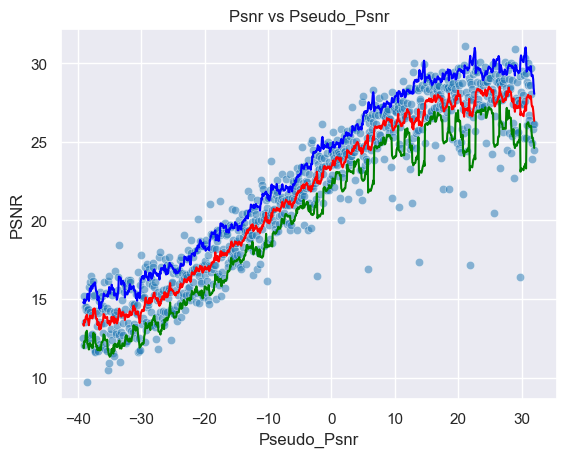

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

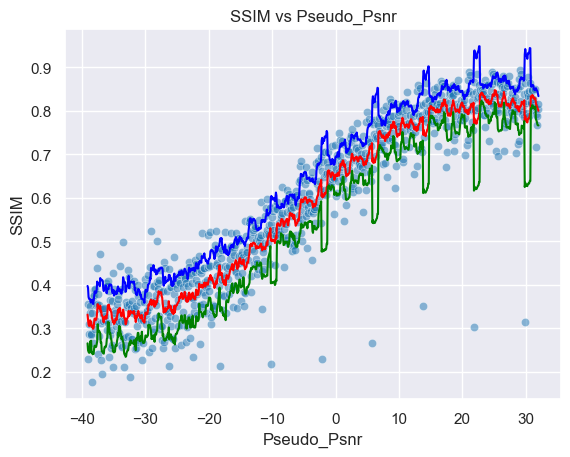

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

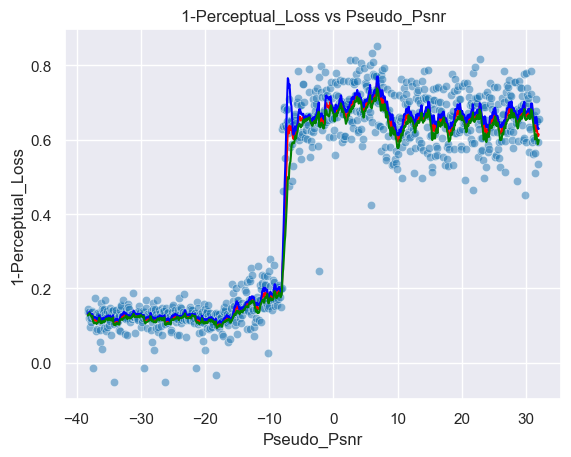

Psnr Area: 1535.544469334355, SSIM Area: 41.68905844500452, Perceptual Area: 30.216538751814866
Mean Psnr 21.66407609415244
Std Psnr 5.376224732352166
Min Psnr 9.705303187962349
Max Psnr 31.086851637429458
Mean Roll Var 1.6154222160854155
Mean SSIM 0.58907413
Std SSIM 0.19622516632080078
Min SSIM 0.1763942688703537
Max SSIM 0.8932435512542725
Mean Roll SSIM 0.05806665760404255
Mean 1-PL 0.43320101
Std 1-PL 0.2701277732849121
Min 1-PL -0.052576422691345215
Max 1-PL 0.8515895009040833
Mean Roll 1-PL 0.056622466802098655


(1535.544469334355, 41.68905844500452, 30.216538751814866)

In [34]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the Adaptive U-Net Model.
Plot_Creater(Psnr_Distribution_6, SSIM_Distribution_6, Perceptual_Distribution_6, minpsnr, maxpsnr)

In [35]:
np.save("Psnr_Distribution_6.npy", Psnr_Distribution_6)
np.save("SSIM_Distribution_6.npy", SSIM_Distribution_6)
np.save("Perceptual_Distribution_6.npy", Perceptual_Distribution_6)

: 

In [27]:
# Create the directory to save the model in for the Channel Spatial Block U-Net Model. 
name = "FaceGenerationCBAMUNetFinal-m40-32"
CHECKPOINT_PATH = "./models/" 

In [28]:
# Set the configuration
levels = 10
channels = 3
up_mode = "upsample"
merge_mode = "concat"
num_layers = 2
dropout_rate = 0.2
learning_rate= 1e-3
weight_decay  = 1e-4
starting_filters = 50
num_blocks_per_layer = 1
mini_batches = 512
warm_up_epochs = 10
epochs = 30
depth = 5
csa_enabled = True

# Create the Channel Spatial Block Attention U-Net model for the Face Generation.
from CBAMResidualUNet_Final import CBAMResUNet

model  = CBAMResUNet(
                levels = levels,
                channels = channels,
                up_mode = up_mode,
                num_layers = num_layers,
                dropout_rate = dropout_rate,
                learning_rate = learning_rate,
                weight_decay = weight_decay,
                starting_filters = starting_filters,
                num_blocks_per_layer = num_blocks_per_layer,
                mini_batches = mini_batches,
                warm_up_epochs = warm_up_epochs,
                epochs = epochs,
                depth = depth,
                csa_enabled = csa_enabled)

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\CBAMResidualUNet_Final.py:523: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\CBAMResidualUNet_Final.py:525: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\CBAMResidualUNet_Final.py:528: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDrive\Documents\Li

In [29]:
model

CBAMResUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (Feature_Inception_Block): Feature_Inception_Block(
    (conv1x1): Sequential(
      (0): Conv2d(30, 7, kernel_size=(1, 1), stride=(1, 1))
      (1): GroupNorm(1, 7, eps=1e-05, affine=True)
      (2): LeakyReLU(negative_slope=0.01)
    )
    (conv3x3): Sequential(
      (0): Conv2d(30, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): GroupNorm(1, 7, eps=1e-05, affine=True)
      (2): LeakyReLU(negative_slope=0.01)
    )
    (conv5x5): Sequential(
      (0): Conv2d(30, 7, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (1): GroupNorm(1, 7, eps=1e-05, affine=True)
      (2): LeakyReLU(negative_slope=0.01)
    )
    (conv7x7): Sequential(
      (0): Conv2d(30, 7, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
      (1): GroupNorm(1, 7, eps=1e-05, affine=True)
      (2): LeakyReLU(negative_slope=0.01)
    )
    (Bottleneck_Layer): Conv2d(28, 30, kernel_size=(1, 1), stride=(1, 1))
    (Channel_Attenti

In [30]:
# Set the configuration 
hyperparameters = {
        "learning_rate": learning_rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size
    }

# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

In [31]:
# Trains the model using the Pytorch Lightning Trainer for the 
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=max_epochs,
                     enable_checkpointing=False,
                     callbacks=[LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                    | Type                    | Params
--------------------------------------------------------------------
0 | activation              | LeakyReLU               | 0     
1 | Feature_Inception_Block | Feature_Inception_Block | 18.7 K
2 | encoder                 | ModuleList              | 19.3 M
3 | Bottleneck_Block        | ModuleList              | 57.9 M
4 | decoder                 | ModuleList              | 32.4 M
5 | output                  | Conv2d                  | 153   
-----------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [32]:
# Validates the trained model on the Train Set for the Channel Spatial Block Attention U-Net Model.
Trainer.test(model, Train_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:492: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13487961888313293    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13487961888313293}]

In [33]:
# Validates the trained model on the Validation Set for the Channel Spatial Block Attention U-Net Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    -0.1357986330986023    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.1357986330986023}]

In [34]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []
for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)
Psnr_Distribution_7 = np.array(Psnr_Distribution)
SSIM_Distribution_7 = np.array(SSIM_Distribution)
Perceptual_Distribution_7 = np.array(Perceptual_Distribution)
Psnr_Distribution_7.shape, SSIM_Distribution_7.shape, Perceptual_Distribution_7.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,22.284506,-3.559511,22.195813,1.504176,23.699989,20.691637
std,5.918039,20.564969,5.742907,0.449550,5.790242,5.730555
min,9.708973,-39.119021,13.037532,0.635387,14.380367,11.344836
25%,16.927766,-21.339266,16.782855,1.195727,18.039098,15.328738
50%,22.690004,-3.559511,22.603807,1.413924,23.956825,21.253368
75%,27.647781,14.220245,27.805906,1.739204,29.805172,26.061720
max,32.636795,32.000000,30.371179,3.316684,32.712838,29.368053


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.606999,-3.559511,0.603805,0.058418,0.662224,0.545387
std,0.206308,20.564969,0.197118,0.028611,0.195185,0.203102
min,0.183247,-39.119021,0.297529,0.012049,0.350233,0.239277
25%,0.412280,-21.339266,0.405172,0.043060,0.461532,0.334511
50%,0.621413,-3.559511,0.615425,0.053442,0.674111,0.547178
75%,0.809598,14.220245,0.799518,0.063729,0.858648,0.746466
max,0.914583,32.000000,0.878077,0.161355,0.992009,0.865310


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.453693,-3.119021,0.450390,0.055904,0.460741,0.440038
std,0.286109,20.310653,0.280364,0.028309,0.284655,0.276732
min,-0.052616,-38.238042,0.099317,0.010954,0.101894,0.093831
25%,0.134973,-20.678532,0.125225,0.035327,0.128558,0.121579
50%,0.606031,-3.119021,0.657948,0.055571,0.672687,0.640749
75%,0.712209,14.440489,0.699297,0.072392,0.710939,0.688773
max,0.882887,32.000000,0.788235,0.248119,0.802247,0.779079


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

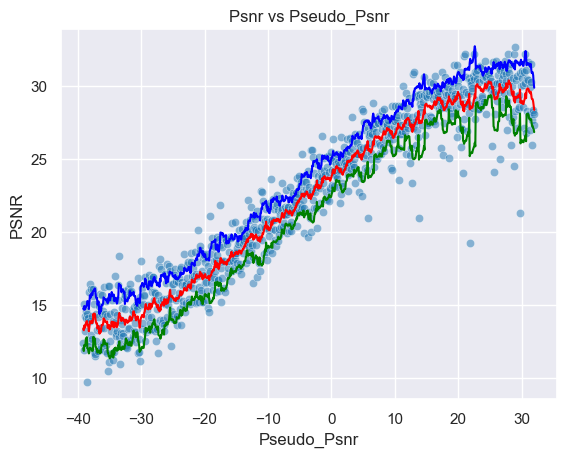

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

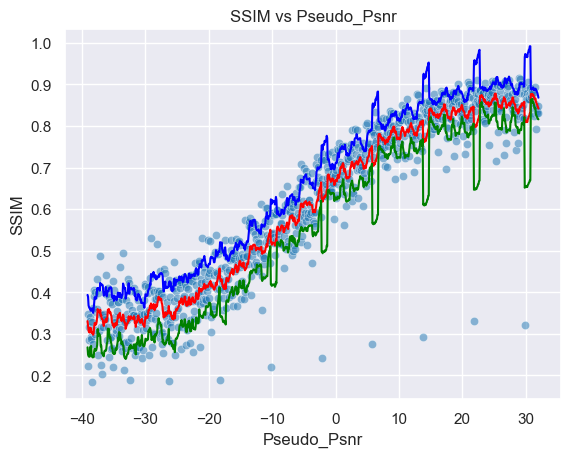

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

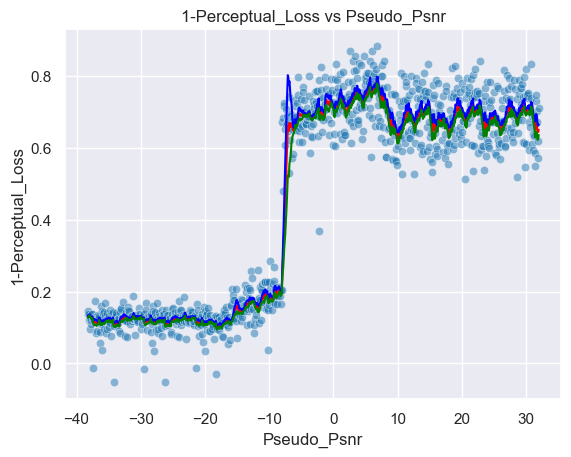

Psnr Area: 1578.6500831835679, SSIM Area: 42.943444940650025, Perceptual Area: 31.639342898521594
Mean Psnr 22.28450606966055
Std Psnr 5.918038745227693
Min Psnr 9.70897308182564
Max Psnr 32.63679491769657
Mean Roll Var 1.5041762285294127
Mean SSIM 0.6069993
Std SSIM 0.20630775392055511
Min SSIM 0.18324749171733856
Max SSIM 0.914583146572113
Mean Roll SSIM 0.05841839495484905
Mean 1-PL 0.45369315
Std 1-PL 0.28610914945602417
Min 1-PL -0.05261552333831787
Max 1-PL 0.8828871250152588
Mean Roll 1-PL 0.05590405282403401


(1578.6500831835679, 42.943444940650025, 31.639342898521594)

In [35]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the Channel Spatial Block Attention U-Net Model.
Plot_Creater(Psnr_Distribution_7, SSIM_Distribution_7, Perceptual_Distribution_7, minpsnr, maxpsnr)

In [36]:
np.save("Psnr_Distribution_7.npy", Psnr_Distribution_7)
np.save("SSIM_Distribution_7.npy", SSIM_Distribution_7)
np.save("Perceptual_Distribution_7.npy", Perceptual_Distribution_7)

In [31]:
# Initial Configuration for the Attention Residual U-Net Model.
levels = 10
channels = 3
depth = 5
up_mode = "upsample"
merge_mode = "concat"
num_layers = 2
dropout_rate = 0.2
learning_rate= 1e-3
weight_decay  = 1e-4
starting_filters = 50
num_blocks_per_layer = 1
mini_batches = 512
warm_up_epochs = 10
epochs = 30
num_conditions = 1
num_heads = 16
dim_k = 64
units = 128
attention_list = [False, False, True, True, True]
bottleneck_attn_type  = True

# Create the Attention Residual U-Net model for the Face Generation.
from AttentionResidualUNet_Final import AttnResUNet
model = AttnResUNet(
                levels = levels,
                channels = channels,
                depth = depth,
                up_mode = up_mode,
                num_layers = num_layers,
                dropout_rate = dropout_rate,
                learning_rate = learning_rate,
                weight_decay = weight_decay,
                starting_filters = starting_filters,
                num_blocks_per_layer = num_blocks_per_layer,
                mini_batches = mini_batches,
                warm_up_epochs = warm_up_epochs,
                epochs = epochs,
                num_conditions = num_conditions,
                num_heads = num_heads,
                dim_k = dim_k,
                units = units,
                attention_list = attention_list,
                bottleneck_attn_type = bottleneck_attn_type).to(device)
model

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\AttentionResidualUNet_Final.py:497: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\AttentionResidualUNet_Final.py:499: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\AttentionResidualUNet_Final.py:502: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDri

AttnResUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Block): Sequential(
        (0): Conv2d(30, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (Main_Processing_Block): Sequential(
        (0): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
        (3): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): GroupNorm(10, 50, eps=1e-05, affine=True)
        (5): LeakyReLU(negative_slope=0.01)
      )
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (dropout): Dropout(p=0.2, inplace=False)
    )
    (1): DownConvolutionBlock(
      (activation): LeakyReLU(negat

In [32]:
# Set the configuration 
hyperparameters = {
        "learning_rate": learning_rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size
    }

# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

In [33]:
name = "FaceGenerationAttentionUNetFinal-m40-32"
CHECKPOINT_PATH = "./models/" 

In [34]:
# Trains the model using the Pytorch Lightning Trainer for the Attention Residual U-Net Model.
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=max_epochs,
                     enable_checkpointing=False,
                     callbacks=[LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type       | Params
------------------------------------------------
0 | activation       | LeakyReLU  | 0     
1 | encoder          | ModuleList | 24.9 M
2 | Bottleneck_Block | ModuleList | 64.2 M
3 | decoder          | ModuleList | 38.2 M
4 | output           | Conv2d     | 153   
------------------------------------------------
127 M     Trainable params
0         Non-trainable params
127 M     Total params
509.027   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [35]:
# Validates the trained model on the Train Set for the Attention Residual U-Net Model.
Trainer.test(model, Train_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:492: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13487717509269714    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13487717509269714}]

In [36]:
# Validates the trained model on the Validation Set for the Attention Residual U-Net Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13541877269744873    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13541877269744873}]

In [37]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []
for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)
Psnr_Distribution_8 = np.array(Psnr_Distribution)
SSIM_Distribution_8 = np.array(SSIM_Distribution)
Perceptual_Distribution_8 = np.array(Perceptual_Distribution)
Psnr_Distribution_8.shape, SSIM_Distribution_8.shape, Perceptual_Distribution_8.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,22.140600,-3.559511,22.051484,1.468404,23.519888,20.583080
std,5.881068,20.564969,5.712442,0.439338,5.777250,5.680968
min,9.800667,-39.119021,13.070702,0.632995,14.396253,11.362526
25%,16.783914,-21.339266,16.685687,1.163387,17.880982,15.285182
50%,22.383009,-3.559511,22.305452,1.380509,23.593592,21.008490
75%,27.571150,14.220245,27.680082,1.708190,29.731911,25.957080
max,32.455127,32.000000,30.187760,2.994908,32.296897,29.218142


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.597744,-3.559511,0.594538,0.056998,0.651536,0.537541
std,0.206895,20.564969,0.198046,0.028196,0.196133,0.203879
min,0.174267,-39.119021,0.298864,0.014306,0.355212,0.234573
25%,0.405241,-21.339266,0.392514,0.041975,0.444386,0.328165
50%,0.607285,-3.559511,0.597061,0.051184,0.655658,0.531111
75%,0.803852,14.220245,0.791577,0.061501,0.852811,0.736808
max,0.913036,32.000000,0.872733,0.161192,0.983716,0.858427


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.441369,-3.119021,0.438109,0.055946,0.448367,0.427852
std,0.278876,20.310653,0.272796,0.028876,0.277203,0.269017
min,-0.052286,-38.238042,0.100134,0.010989,0.102826,0.094066
25%,0.135003,-20.678532,0.125276,0.034864,0.128566,0.121609
50%,0.589883,-3.119021,0.641279,0.056121,0.656867,0.626042
75%,0.689813,14.440489,0.681767,0.071937,0.693660,0.670250
max,0.869605,32.000000,0.772364,0.240708,0.784689,0.762470


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

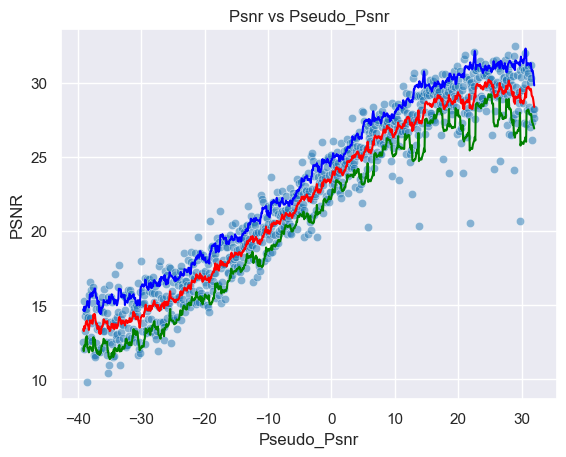

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

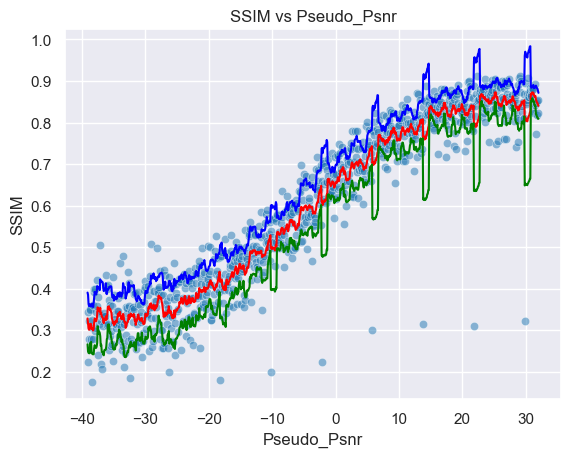

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

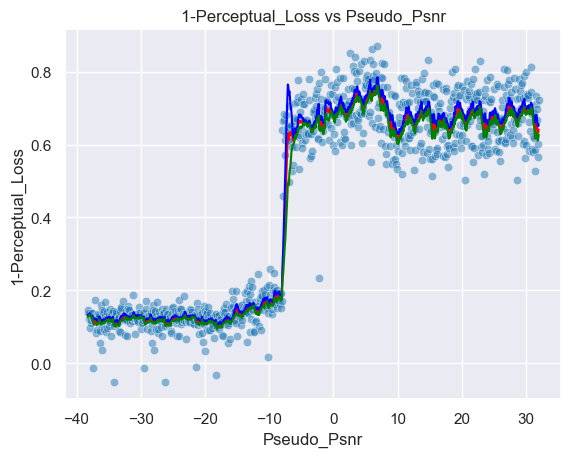

Psnr Area: 1568.373362937942, SSIM Area: 42.28381359829123, Perceptual Area: 30.776150715629573
Mean Psnr 22.14060032643985
Std Psnr 5.881067936726684
Min Psnr 9.800666699572913
Max Psnr 32.45512727081148
Mean Roll Var 1.4684040400688037
Mean SSIM 0.59774387
Std SSIM 0.20689457654953003
Min SSIM 0.17426697909832
Max SSIM 0.913036048412323
Mean Roll SSIM 0.05699771196831665
Mean 1-PL 0.4413688
Std 1-PL 0.2788758873939514
Min 1-PL -0.05228590965270996
Max 1-PL 0.8696048855781555
Mean Roll 1-PL 0.05594555097789466


(1568.373362937942, 42.28381359829123, 30.776150715629573)

In [40]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the Attention Residual U-Net Model.
Plot_Creater(Psnr_Distribution_8, SSIM_Distribution_8, Perceptual_Distribution_8, minpsnr, maxpsnr)

In [1]:
np.save("Psnr_Distribution_8.npy", Psnr_Distribution_8)
np.save("SSIM_Distribution_8.npy", SSIM_Distribution_8)
np.save("Perceptual_Distribution_8.npy", Perceptual_Distribution_8)

NameError: name 'np' is not defined

In [25]:
# Initial Configuration for the Cross Attention Residual U-Net Model.
levels = 10
channels = 3
depth = 5
up_mode = "upsample"
merge_mode = "concat"
num_layers = 2
dropout_rate = 0.2
learning_rate= 1e-3
weight_decay  = 1e-4
starting_filters = 50
num_blocks_per_layer = 1
mini_batches = 512
warm_up_epochs = 10
epochs = max_epochs
num_conditions = 1
num_heads = 16
dim_k = 64
embedding_dim = 64
hidden_dim = 16
units = 128
attention_list = [False, False, True, True, True]
bottleneck_attn_type  = True

# Create the Cross Attention Residual U-Net model for the Face Generation.
from CrossAttentionUNet_Final2 import CrossAttnResUNet

model = CrossAttnResUNet(
                levels = levels,
                channels = channels,
                depth = depth,
                up_mode = up_mode,
                num_layers = num_layers,
                dropout_rate = dropout_rate,
                learning_rate = learning_rate,
                weight_decay = weight_decay,
                starting_filters = starting_filters,
                num_blocks_per_layer = num_blocks_per_layer,
                mini_batches = mini_batches,
                warm_up_epochs = warm_up_epochs,
                epochs = epochs,
                num_conditions = num_conditions,
                num_heads = num_heads,
                dim_k = dim_k,
                embedding_dim = embedding_dim,
                hidden_dim = hidden_dim,
                units = units,
                attention_list = attention_list,
                bottleneck_attn_type = bottleneck_attn_type).to(device)
model

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\CrossAttentionUNet_Final2.py:566: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\CrossAttentionUNet_Final2.py:568: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\CrossAttentionUNet_Final2.py:558: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDrive\Doc

CrossAttnResUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (NoiseEmbedder): NoiseEmbedder(
    (dense): Linear(in_features=1, out_features=16, bias=True)
    (dense_2): Linear(in_features=16, out_features=64, bias=True)
    (norm): GroupNorm(4, 16, eps=1e-05, affine=True)
    (norm_2): GroupNorm(16, 64, eps=1e-05, affine=True)
    (dropout): Dropout(p=0.2, inplace=False)
  )
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Block): Sequential(
        (0): Conv2d(30, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (Main_Processing_Block): Sequential(
        (0): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
        (3): Conv2d(50, 50, kernel_size=(3, 3), stride=(1, 1), paddi

In [26]:
# Set the configuration 
hyperparameters = {
        "learning_rate": learning_rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size
    }

# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

In [27]:
# Trains the model using the Pytorch Lightning Trainer for the Cross Attention Residual U-Net Model.
name = "FaceGenerationCrossAttentionUNetFinal-m40-32"
CHECKPOINT_PATH = "./models/" 

In [28]:
# Trains the model using the Pytorch Lightning Trainer for the Cross Attention Residual U-Net Model.
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=max_epochs,
                     enable_checkpointing=False,
                     callbacks=[LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type          | Params
---------------------------------------------------
0 | activation       | LeakyReLU     | 0     
1 | NoiseEmbedder    | NoiseEmbedder | 1.3 K 
2 | encoder          | ModuleList    | 25.1 M
3 | Bottleneck_Block | ModuleList    | 64.2 M
4 | decoder          | ModuleList    | 38.3 M
5 | output           | Conv2d        | 153   
---------------------------------------------------
127 M     Trainable params
0         Non-trainable params
127 M     Total params
510.867   Total estimated model params

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [29]:
# Validates the trained model on the Train Set for the Cross Attention Residual U-Net Model.
Trainer.test(model, Train_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:492: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13403722643852234    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13403722643852234}]

In [30]:
# Validates the trained model on the Validation Set for the Cross Attention Residual U-Net Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13401877880096436    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13401877880096436}]

In [31]:
CHECKPOINT_PATH + name

'./models/FaceGenerationCrossAttentionUNetFinal-m40-32'

In [32]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end], Psnr_Maps[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []
for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)
Psnr_Distribution_9 = np.array(Psnr_Distribution)
SSIM_Distribution_9 = np.array(SSIM_Distribution)
Perceptual_Distribution_9 = np.array(Perceptual_Distribution)
Psnr_Distribution_9.shape, SSIM_Distribution_9.shape, Perceptual_Distribution_9.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,22.113426,-3.559511,22.026642,1.473296,23.499938,20.553347
std,5.860662,20.564969,5.691380,0.429171,5.764081,5.650430
min,9.830633,-39.119021,13.050966,0.671237,14.444016,11.484390
25%,16.754290,-21.339266,16.646416,1.164824,17.885355,15.211911
50%,22.306678,-3.559511,22.339487,1.381392,23.716089,20.967169
75%,27.534137,14.220245,27.658592,1.712293,29.674678,25.789006
max,32.445770,32.000000,30.078945,3.071367,32.053027,29.027624


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.596098,-3.559511,0.592917,0.056401,0.649319,0.536516
std,0.206835,20.564969,0.198328,0.027078,0.196166,0.204091
min,0.177165,-39.119021,0.292624,0.016172,0.344935,0.230291
25%,0.401361,-21.339266,0.389646,0.041981,0.445752,0.324888
50%,0.610260,-3.559511,0.596704,0.050916,0.658186,0.532677
75%,0.799680,14.220245,0.793769,0.060869,0.851141,0.733766
max,0.910389,32.000000,0.870506,0.154145,0.973867,0.849948


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.442945,-3.119021,0.439736,0.056307,0.449933,0.429538
std,0.279119,20.310653,0.272976,0.029388,0.277361,0.269250
min,-0.052266,-38.238042,0.100144,0.011008,0.102799,0.094307
25%,0.134761,-20.678532,0.125213,0.034983,0.128532,0.121563
50%,0.589729,-3.119021,0.642531,0.054958,0.656379,0.625601
75%,0.695527,14.440489,0.683429,0.072778,0.694905,0.673097
max,0.864418,32.000000,0.769005,0.245912,0.783327,0.756763


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

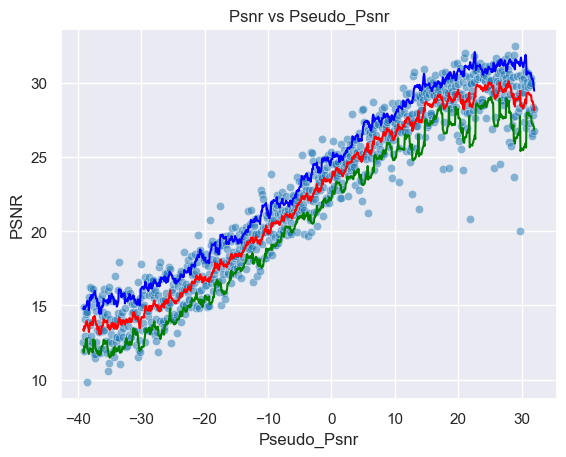

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

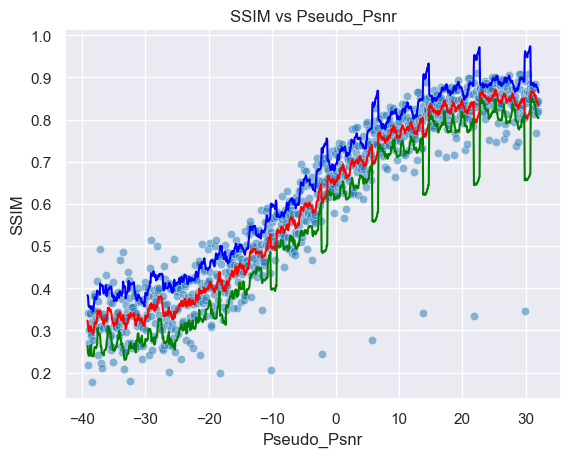

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

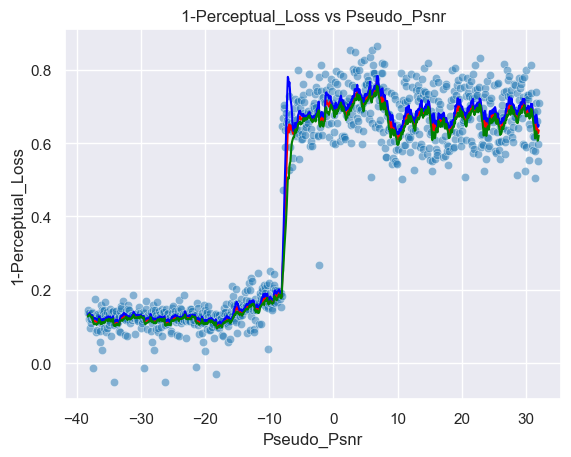

Psnr Area: 1566.6132446064114, SSIM Area: 42.16883112243205, Perceptual Area: 30.89075564714905
Mean Psnr 22.11342575327826
Std Psnr 5.860662230102407
Min Psnr 9.830633291010832
Max Psnr 32.44576980169663
Mean Roll Var 1.4732957005630964
Mean SSIM 0.59609795
Std SSIM 0.2068350911140442
Min SSIM 0.17716465890407562
Max SSIM 0.9103893637657166
Mean Roll SSIM 0.05640127229504815
Mean 1-PL 0.44294542
Std 1-PL 0.2791185677051544
Min 1-PL -0.05226600170135498
Max 1-PL 0.8644176125526428
Mean Roll 1-PL 0.05630741145322856


(1566.6132446064114, 42.16883112243205, 30.89075564714905)

In [33]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the Cross Attention Residual U-Net Model.
Plot_Creater(Psnr_Distribution_9, SSIM_Distribution_9, Perceptual_Distribution_9, minpsnr, maxpsnr)

In [34]:
np.save("Psnr_Distribution_9.npy", Psnr_Distribution_9)
np.save("SSIM_Distribution_9.npy", SSIM_Distribution_9)
np.save("Perceptual_Distribution_9.npy", Perceptual_Distribution_9)

In [26]:
# Initial Configuration for the Dense U-Net Model.
from DenseUNet_Final2 import DenseUNet

In [33]:
# Create the Dense U-Net model for the Face Generation.
levels = 10
channels = 3
depth = 5
up_mode = "upsample"
merge_mode = "concat"
num_layers = 2
dropout_rate = 0.2
learning_rate= 5e-4
weight_decay  = 1e-5
starting_filters = 50
num_blocks_per_layer = 1
mini_batches = 512
warm_up_epochs = 10
epochs = max_epochs
num_conditions = 1
csa_enabled = True
growth_rate = 32


# Create the Dense U-Net model for the Face Generation.
model = DenseUNet(
                levels = levels,
                channels = channels,
                depth = depth,
                up_mode = up_mode,
                num_layers = num_layers,
                dropout_rate = dropout_rate,
                learning_rate = learning_rate,
                weight_decay = weight_decay,
                starting_filters = starting_filters,
                num_blocks_per_layer = num_blocks_per_layer,
                mini_batches = mini_batches,
                warm_up_epochs = warm_up_epochs,
                epochs = epochs,
                growth_rate=growth_rate,
                csa_enabled = csa_enabled).to(device)
model

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DenseUNet_Final2.py:461: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DenseUNet_Final2.py:463: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DenseUNet_Final2.py:466: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Pro

DenseUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Conv): Sequential(
        (0): Conv2d(30, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (DenseBlock): Sequential(
        (0): DenseLayer(
          (activation): LeakyReLU(negative_slope=0.01)
          (groupnorm_1): GroupNorm(10, 50, eps=1e-05, affine=True)
          (conv1): Conv2d(50, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (groupnorm_2): GroupNorm(32, 128, eps=1e-05, affine=True)
          (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (dropout): Dropout2d(p=0.2, inplace=False)
        )
        (1): DenseLayer(
          (activation)

In [25]:
# Create the directory to save the model in for the Dense U-Net Model.
name = "FaceGenerationDenseUNet128x128-m40-32"
CHECKPOINT_PATH = "./models/" 

In [27]:
# Load the model from the checkpoint
model = DenseUNet.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\utilities\parsing.py:199: Attribute 'activation' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation'])`.
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DenseUNet_Final2.py:461: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight, nonlinearity = "leaky_relu")
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DenseUNet_Final2.py:463: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias, 0)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Projects\GAPGalaxies\DenseUNet_Final2.py:466: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.weight, 1)
c:\Users\kdarn\OneDrive\Documents\Life's Portfolio\Pro

In [30]:
# Set the configuration 
hyperparameters = {
        "learning_rate": learning_rate,
        "epochs": max_epochs,
        "batch_size": Batch_Size,
        "root_path": root_path,
        "out_dir": out_dir,
        "load_pretained": load_pretained,
        "max_epochs": max_epochs,
        "patience": patience,
        "minpsnr": minpsnr,
        "maxpsnr": maxpsnr,
        "device":"cuda",
        "seed": seed,
        "GREYSCALE":GREYSCALE,
        "NUM_Features": NUM_Features,
        "num_conditions": 5,
        "n_channels": 64, 
        "activation": "LeakyReLU",
        "dropout_rate": 0.3,
        "amplification_factor": 1e3,
        "virtSize": 512*Batch_Size
    }

# Initialize wandb logger
wandb_logger = WandbLogger(
    project="GAP_Model_CrossAttnUNet",
    log_model=True,  # Log checkpoints and best model
    config = hyperparameters
)

NameError: name 'learning_rate' is not defined

In [33]:
# Trains the model using the Pytorch Lightning Trainer for the Dense U-Net Model.
Trainer = pL.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=13,
                     enable_checkpointing=False,
                     callbacks=[LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=10),
                                ])
Trainer.fit(model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name             | Type       | Params
------------------------------------------------
0 | activation       | LeakyReLU  | 0     
1 | encoder          | ModuleList | 9.0 M 
2 | Bottleneck_Block | ModuleList | 18.3 M
3 | decoder          | ModuleList | 32.5 M
4 | output           | Conv2d     | 153   
------------------------------------------------
59.9 M    Trainable params
0         Non-trainable params
59.9 M    Total params
239.503   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=13` reached.


In [38]:
# Saves the model to the checkpoint
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

In [35]:
# Validates the trained model on the Train Set for the Dense U-Net Model.
Trainer.test(model, Train_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:492: Your `test_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    -0.1334257423877716    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.1334257423877716}]

In [36]:
# Validates the trained model on the Validation Set for the Dense U-Net Model.
Trainer.test(model, Validation_Loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.13571681082248688    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.13571681082248688}]

In [39]:
model

DenseUNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (encoder): ModuleList(
    (0): DownConvolutionBlock(
      (activation): LeakyReLU(negative_slope=0.01)
      (Skip_Conv): Sequential(
        (0): Conv2d(30, 50, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): GroupNorm(10, 50, eps=1e-05, affine=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (DenseBlock): Sequential(
        (0): DenseLayer(
          (activation): LeakyReLU(negative_slope=0.01)
          (groupnorm_1): GroupNorm(10, 50, eps=1e-05, affine=True)
          (conv1): Conv2d(50, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (groupnorm_2): GroupNorm(32, 128, eps=1e-05, affine=True)
          (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (dropout): Dropout2d(p=0.2, inplace=False)
        )
        (1): DenseLayer(
          (activation)

In [30]:
lpips_model = lpips.LPIPS(net='alex').to(device)

def Generate_Psnr_Scores(model, Noisy_Images, Psnr_Maps, Target_Images):
    model.eval()
    model = model.to(device)
    Noisy_Images = Noisy_Images.to(device)
    Psnr_Maps = Psnr_Maps.to(device)
    Target_Images = Target_Images.to(device)

    Predictions = torch.zeros(Noisy_Images.shape[0], 3, 128, 128).to(device)
    
    # Process batches correctly without slicing errors
    batch_size = 32
    with torch.no_grad():
        for i in range(0, Noisy_Images.shape[0], batch_size):
            batch_end = min(i + batch_size, Noisy_Images.shape[0])  # Ensure no overflow
            Predictions[i:batch_end] = model(Noisy_Images[i:batch_end]).detach()

        # Adjust predictions after getting model output
        Predictions = torch.exp(Predictions - Predictions.max())  # Handle exp safely to avoid overflow
        Predictions = Noisy_Images.detach().sum(dim=(1, 2, 3), keepdim=True) * Predictions / Predictions.sum(dim=(1, 2, 3), keepdim=True)
        
        perceptual_score = lpips_model(Target_Images, Predictions)
        perceptual_score = 1 - perceptual_score
        
        # Move everything to CPU for further processing
        Noisy_Images = Noisy_Images.cpu().numpy()
        Target_Images = Target_Images.cpu().numpy()
        Predictions = Predictions.cpu().numpy()
        perceptual_score = perceptual_score.cpu().numpy()

        # Normalize Predictions correctly
        Predictions = Predictions / Predictions.mean(axis=(1, 2, 3), keepdims=True)
        
        # Compute PSNR and SSIM scores
        Psnr_Scores = [psnr(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min()) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        SSIM_Scores = [ssim(Target_Image, Prediction, data_range=Target_Image.max() - Target_Image.min(), channel_axis=0) for Target_Image, Prediction in zip(Target_Images, Predictions)]
        
        return Psnr_Scores, SSIM_Scores, perceptual_score.reshape(-1,)

Psnr_Distribution = []
SSIM_Distribution = []
Perceptual_Distribution = []
for key in Validation_Noisy_Images.keys():
    if key == "3240":
        continue
    print(key)
    Psnr_Scores, SSIM_Scores, Perceptual_Scores = Generate_Psnr_Scores(model, Validation_Noisy_Images[key], Validation_Psnr_Maps[key], Validation_Target_Images[key])
    Psnr_Distribution.extend(Psnr_Scores)
    SSIM_Distribution.extend(SSIM_Scores)
    Perceptual_Distribution.extend(Perceptual_Scores)
Psnr_Distribution_10 = np.array(Psnr_Distribution)
SSIM_Distribution_10 = np.array(SSIM_Distribution)
Perceptual_Distribution_10 = np.array(Perceptual_Distribution)
Psnr_Distribution_10.shape, SSIM_Distribution_10.shape, Perceptual_Distribution_10.shape

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\lpips\weights\v0.1\alex.pth
-40-32
-32-24
-24-16
-16-8
-80
08
816
1624
2432


((900,), (900,), (900,))

,PSNR,Pseudo_PSNR,PSNR_Average,PSNR_Variance,PSNR_Variance_Upper,PSNR_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,21.960319,-3.559511,21.873028,1.495484,23.368512,20.377543
std,5.653105,20.564969,5.469551,0.445552,5.543090,5.431682
min,9.668665,-39.119021,13.069795,0.673777,14.407411,11.409961
25%,16.852991,-21.339266,16.729044,1.168070,17.966897,15.301100
50%,22.321545,-3.559511,22.329945,1.403370,23.697650,21.009855
75%,27.321383,14.220245,27.275218,1.800368,29.110757,25.405188
max,31.319773,32.000000,29.539310,2.853591,31.578477,28.442306


,SSIM,Pseudo_PSNR,SSIM_Average,SSIM_Variance,SSIM_Variance_Upper,SSIM_Variance_Lower
count,889.000000,889.000000,889.000000,889.000000,889.000000,889.000000
mean,0.598550,-3.559511,0.595287,0.057165,0.652451,0.538122
std,0.203577,20.564969,0.194749,0.026152,0.192844,0.200084
min,0.178590,-39.119021,0.300770,0.016320,0.357093,0.228626
25%,0.406837,-21.339266,0.395478,0.042849,0.450664,0.330663
50%,0.611655,-3.559511,0.600515,0.052452,0.658561,0.536528
75%,0.795685,14.220245,0.790364,0.062076,0.850793,0.737762
max,0.915394,32.000000,0.871433,0.155132,0.980020,0.855113


,1-PL,Pseudo_PSNR,1-PL_Average,1-PL_Variance,1-PL_Variance_Upper,1-PL_Variance_Lower
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,0.443779,-3.119021,0.440524,0.055980,0.450832,0.430217
std,0.280495,20.310653,0.274528,0.028218,0.278834,0.270854
min,-0.052343,-38.238042,0.098534,0.010985,0.101309,0.092689
25%,0.134312,-20.678532,0.125162,0.035400,0.128237,0.121507
50%,0.590358,-3.119021,0.643770,0.055863,0.659759,0.630368
75%,0.692841,14.440489,0.684175,0.072024,0.695050,0.673019
max,0.887100,32.000000,0.782635,0.240084,0.796167,0.771507


c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

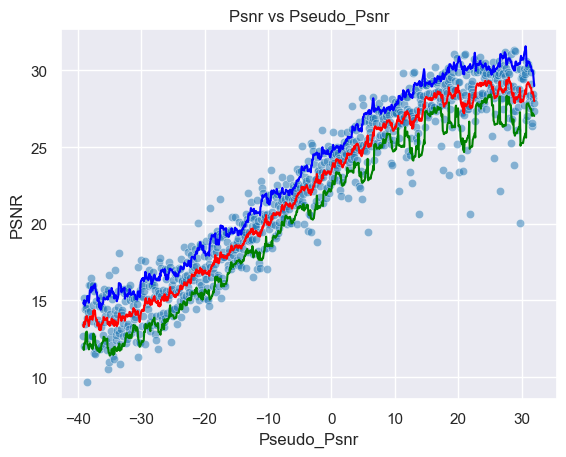

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

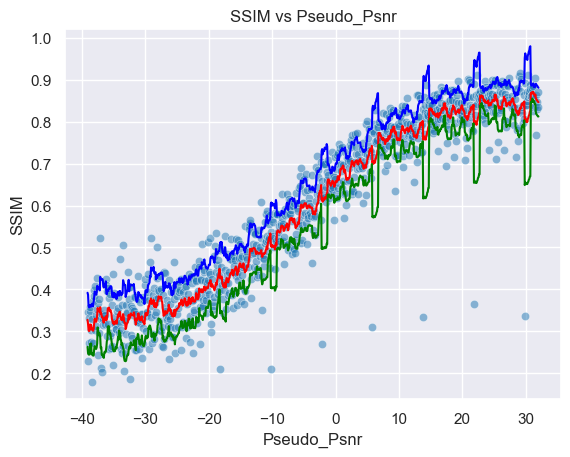

c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\kdarn\anaconda3\envs\GAPGalaxy\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in 

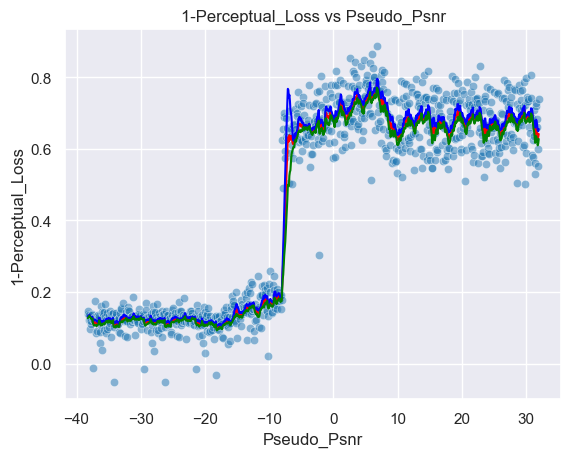

Psnr Area: 1555.6813738738376, SSIM Area: 42.33685246691754, Perceptual Area: 30.94594206381693
Mean Psnr 21.960318602229695
Std Psnr 5.65310518889508
Min Psnr 9.668665161762947
Max Psnr 31.319773006153646
Mean Roll Var 1.495484417653636
Mean SSIM 0.5985504
Std SSIM 0.20357684791088104
Min SSIM 0.1785900592803955
Max SSIM 0.9153940677642822
Mean Roll SSIM 0.057164539595068384
Mean 1-PL 0.44377917
Std 1-PL 0.2804945111274719
Min 1-PL -0.052343010902404785
Max 1-PL 0.887100338935852
Mean Roll 1-PL 0.055980476056438105


(1555.6813738738376, 42.33685246691754, 30.94594206381693)

In [31]:
# Generates the dataframes for the Psnr, SSIM and Perceptual Loss, and produces their plots for the Dense U-Net Model.
Plot_Creater(Psnr_Distribution_10, SSIM_Distribution_10, Perceptual_Distribution_10, minpsnr, maxpsnr)

In [143]:
# Loads the data from the saved files.
Psnr_Distribution_0 = np.load("Data/Psnr_Distribution_0.npy")
SSIM_Distribution_0 = np.load("Data/SSIM_Distribution_0.npy")
Perceptual_Distribution_0 = np.load("Data/Perceptual_Distribution_0.npy")

Psnr_Distribution_Original = np.load("Data/Original_Psnr_Ensemble_Model_m40_32.npy")
SSIM_Distribution_Original = np.load("Data/Original_Ensemble_Model_SSIM_m40_32.npy")
Perceptual_Distribution_Original = np.load("Data/Original_Ensemble_Model_Perceptual_m40_32.npy")

Psnr_Distribution_Curriculum = np.load("Data/Curriculum_Model_m40_32.npy")
SSIM_Distribution_Curriculum = np.load("Data/Curriculum_Model_SSIM_m40_32.npy")
Perceptual_Distribution_Curriculum = np.load("Data/Curriculum_Model_Perceptual_m40_32.npy")

Psnr_Distribution_1 = np.load("Data/Psnr_Distribution_1.npy")
SSIM_Distribution_1 = np.load("Data/SSIM_Distribution_1.npy")
Perceptual_Distribution_1 = np.load("Data/Perceptual_Distribution_1.npy")

Psnr_Distribution_2 = np.load("Data/Psnr_Distribution_2.npy")
SSIM_Distribution_2 = np.load("Data/SSIM_Distribution_2.npy")
Perceptual_Distribution_2 = np.load("Data/Perceptual_Distribution_2.npy")

Psnr_Distribution_3 = np.load("Data/Psnr_Distribution_3.npy")
SSIM_Distribution_3 = np.load("Data/SSIM_Distribution_3.npy")
Perceptual_Distribution_3 = np.load("Data/Perceptual_Distribution_3.npy")

Psnr_Distribution_4 = np.load("Data/Psnr_Distribution_4.npy")
SSIM_Distribution_4 = np.load("Data/SSIM_Distribution_4.npy")
Perceptual_Distribution_4 = np.load("Data/Perceptual_Distribution_4.npy")

Psnr_Distribution_5 = np.load("Data/Psnr_Distribution_5.npy")
SSIM_Distribution_5 = np.load("Data/SSIM_Distribution_5.npy")
Perceptual_Distribution_5 = np.load("Data/Perceptual_Distribution_5.npy")

Psnr_Distribution_6 = np.load("Data/Psnr_Distribution_6.npy")
SSIM_Distribution_6 = np.load("Data/SSIM_Distribution_6.npy")
Perceptual_Distribution_6 = np.load("Data/Perceptual_Distribution_6.npy")

Psnr_Distribution_7 = np.load("Data/Psnr_Distribution_7.npy")
SSIM_Distribution_7 = np.load("Data/SSIM_Distribution_7.npy")
Perceptual_Distribution_7 = np.load("Data/Perceptual_Distribution_7.npy")

Psnr_Distribution_8 = np.load("Data/Psnr_Distribution_8.npy")
SSIM_Distribution_8 = np.load("Data/SSIM_Distribution_8.npy")
Perceptual_Distribution_8 = np.load("Data/Perceptual_Distribution_8.npy")

Psnr_Distribution_9 = np.load("Data/Psnr_Distribution_9.npy")
SSIM_Distribution_9 = np.load("Data/SSIM_Distribution_9.npy")
Perceptual_Distribution_9 = np.load("Data/Perceptual_Distribution_9.npy")

Psnr_Distribution_10 = np.load("Data/Psnr_Distribution_10.npy")
SSIM_Distribution_10 = np.load("Data/SSIM_Distribution_10.npy")
Perceptual_Distribution_10 = np.load("Data/Perceptual_Distribution_10.npy")

Psnr_Distribution_11 = np.load("Data/Psnr_Distribution_11.npy")
SSIM_Distribution_11 = np.load("Data/SSIM_Distribution_11.npy")
Perceptual_Distribution_11 = np.load("Data/Perceptual_Distribution_11.npy")

Psnr_Distribution_12 = np.load("Data/Psnr_Distribution_12.npy")
SSIM_Distribution_12 = np.load("Data/SSIM_Distribution_12.npy")
Perceptual_Distribution_12 = np.load("Data/Perceptual_Distribution_12.npy")

Psnr_Distribution_13 = np.load("Data/Psnr_Distribution_13.npy")
SSIM_Distribution_13 = np.load("Data/SSIM_Distribution_13.npy")
Perceptual_Distribution_13 = np.load("Data/Perceptual_Distribution_13.npy")

Psnr_Distribution_14 = np.load("Data/Psnr_Distribution_14.npy")
SSIM_Distribution_14 = np.load("Data/SSIM_Distribution_14.npy")
Perceptual_Distribution_14 = np.load("Data/Perceptual_Distribution_14.npy")

Psnr_Distribution_15 = np.load("Data/Psnr_Distribution_15.npy")
SSIM_Distribution_15 = np.load("Data/SSIM_Distribution_15.npy")
Perceptual_Distribution_15 = np.load("Data/Perceptual_Distribution_15.npy")

In [144]:
Psnr_Distribution_Original.shape

(891,)

In [146]:
# Combines the data into a single dataframe for the Psnr
uniform = np.linspace(-40, 32, 900)
Psnr_Distribution = pd.DataFrame(
    {   
        "Pseudo_Psnr":uniform,
        "original_model_m40_32":Psnr_Distribution_0,
        "DeepSupervision_m40_32": Psnr_Distribution_2,
        "Gated_model_m40_32": Psnr_Distribution_3,
        "Psnr_model_m40_32": Psnr_Distribution_4,
        "HybridDilated_model_m40_32": Psnr_Distribution_5,
        "AdaptiveUNet_model_m40_32": Psnr_Distribution_6,
        "CBAMUNet_Final_m40_32": Psnr_Distribution_7,
        "AttentionUNet_Final_m40_32": Psnr_Distribution_8,
        "CrossAttentionUNet_Final_m40_32": Psnr_Distribution_9,
        "DenseUNet128x128_m40_32": Psnr_Distribution_10,
        "HierarchicalResUNet_Final_128x128_m40_32": Psnr_Distribution_11,
        #"AdvDeepSupervisionResUNet_Final_128x128_m40_32": Psnr_Distribution_12,
        "DynamicConvolutionResUNet_Final_128x128_m40_32": Psnr_Distribution_13,
        #"HierarchicalDynamicConvUNet_Final_128x128_m40_32": Psnr_Distribution_14,
        "HierarchicalDynamicConvUNet_Final_128x128_m40_32": Psnr_Distribution_15,
    }
)
Psnr_Distribution.head()

,Pseudo_Psnr,original_model_m40_32,DeepSupervision_m40_32,Gated_model_m40_32,Psnr_model_m40_32,HybridDilated_model_m40_32,AdaptiveUNet_model_m40_32,CBAMUNet_Final_m40_32,AttentionUNet_Final_m40_32,CrossAttentionUNet_Final_m40_32,DenseUNet128x128_m40_32,HierarchicalResUNet_Final_128x128_m40_32,DynamicConvolutionResUNet_Final_128x128_m40_32,HierarchicalDynamicConvUNet_Final_128x128_m40_32
0,-40.000000,13.931335,13.757496,14.075244,13.590148,14.055720,13.556102,13.466601,13.864608,13.546501,13.754415,13.663182,13.506633,14.318309
1,-39.919911,11.197247,10.919733,11.318823,10.904722,11.340281,11.049456,11.138152,11.249449,11.009589,11.050836,10.909402,11.078107,12.389062
2,-39.839822,15.486684,15.135062,15.103434,15.224039,15.459543,15.264143,15.110724,15.300104,14.618569,15.719746,14.856200,15.115872,13.577683
3,-39.759733,12.448342,13.236808,12.986180,13.094030,12.538435,13.055991,13.194989,12.783475,13.167109,12.460158,13.142723,13.152384,12.593719
4,-39.679644,11.442880,11.365716,11.456769,11.424882,11.462385,11.265639,11.371819,11.417908,11.248819,11.176351,11.438903,11.253527,11.261924


In [147]:
# Combines the data into a single dataframe for the SSIM 
uniform = np.linspace(-40, 32, 900)
SSIM_Distribution = pd.DataFrame(
    {   
        "Pseudo_Psnr":uniform,
        "original_model_m40_32":SSIM_Distribution_0,
        "DeepSupervision_m40_32": SSIM_Distribution_2,
        "Gated_model_m40_32": SSIM_Distribution_3,
        "Psnr_model_m40_32": SSIM_Distribution_4,
        "HybridDilated_model_m40_32": SSIM_Distribution_5,
        "AdaptiveUNet_model_m40_32": SSIM_Distribution_6,
        "CBAMUNet_Final_m40_32": SSIM_Distribution_7,
        "AttentionUNet_Final_m40_32": SSIM_Distribution_8,
        "CrossAttentionUNet_Final_m40_32": SSIM_Distribution_9,
        "DenseUNet128x128_m40_32": SSIM_Distribution_10,
        "HierarchicalResUNet_Final_128x128_m40_32": SSIM_Distribution_11,
        #"AdvDeepSupervisionResUNet_Final_128x128_m40_32": SSIM_Distribution_12,
        "DynamicConvolutionResUNet_Final_128x128_m40_32": SSIM_Distribution_13,
        #"HierarchicalDynamicConvUNet_Final_128x128_m40_32": SSIM_Distribution_14,
        "HierarchicalDynamicConvUNet_Final_128x128_m40_32": SSIM_Distribution_15,
    }
)
SSIM_Distribution.head()

,Pseudo_Psnr,original_model_m40_32,DeepSupervision_m40_32,Gated_model_m40_32,Psnr_model_m40_32,HybridDilated_model_m40_32,AdaptiveUNet_model_m40_32,CBAMUNet_Final_m40_32,AttentionUNet_Final_m40_32,CrossAttentionUNet_Final_m40_32,DenseUNet128x128_m40_32,HierarchicalResUNet_Final_128x128_m40_32,DynamicConvolutionResUNet_Final_128x128_m40_32,HierarchicalDynamicConvUNet_Final_128x128_m40_32
0,-40.000000,0.390496,0.390728,0.406750,0.340224,0.360810,0.354631,0.354505,0.359923,0.347063,0.350897,0.400334,0.389995,0.382863
1,-39.919911,0.526384,0.521891,0.536872,0.402371,0.439105,0.431400,0.429022,0.429600,0.417511,0.442855,0.519565,0.523797,0.548680
2,-39.839822,0.375515,0.367426,0.372663,0.342181,0.355619,0.348295,0.351981,0.356757,0.332149,0.360815,0.360423,0.368357,0.346684
3,-39.759733,0.356718,0.375011,0.373456,0.339207,0.330817,0.352243,0.357464,0.338756,0.340989,0.332982,0.382244,0.381479,0.352668
4,-39.679644,0.221678,0.210691,0.213093,0.178947,0.197153,0.183331,0.190690,0.190296,0.189136,0.186492,0.210035,0.205728,0.214125


In [148]:
# Combines the data into a single dataframe for the Perceptual Loss Scores.
uniform = np.linspace(-40, 32, 900)
Perceptual_Distribution = pd.DataFrame(
    {   
        "Pseudo_Psnr":uniform,
        "original_model_m40_32":Perceptual_Distribution_0,
        #"residual_learning_m40_32": Perceptual_Distribution_1,
        "DeepSupervision_m40_32": Perceptual_Distribution_2,
        "Gated_model_m40_32": Perceptual_Distribution_3,
        "Psnr_model_m40_32": Perceptual_Distribution_4,
        "HybridDilated_model_m40_32": Perceptual_Distribution_5,
        "AdaptiveUNet_model_m40_32": Perceptual_Distribution_6,
        "CBAMUNet_Final_m40_32": Perceptual_Distribution_7,
        "AttentionUNet_Final_m40_32": Perceptual_Distribution_8,
        "CrossAttentionUNet_Final_m40_32": Perceptual_Distribution_9,
        "DenseUNet128x128_m40_32": Perceptual_Distribution_10,
        "HierarchicalResUNet_Final_128x128_m40_32": Perceptual_Distribution_11,
        #"AdvDeepSupervisionResUNet_Final_128x128_m40_32": Perceptual_Distribution_12,
        "DynamicConvolutionResUNet_Final_128x128_m40_32": Perceptual_Distribution_13,
        #"HierarchicalDynamicConvUNet_Final_128x128_m40_32": Perceptual_Distribution_14,
        "HierarchicalDynamicConvUNet_Final_128x128_m40_32": Perceptual_Distribution_15,
    }
)
Psnr_Distribution.head()

,Pseudo_Psnr,original_model_m40_32,DeepSupervision_m40_32,Gated_model_m40_32,Psnr_model_m40_32,HybridDilated_model_m40_32,AdaptiveUNet_model_m40_32,CBAMUNet_Final_m40_32,AttentionUNet_Final_m40_32,CrossAttentionUNet_Final_m40_32,DenseUNet128x128_m40_32,HierarchicalResUNet_Final_128x128_m40_32,DynamicConvolutionResUNet_Final_128x128_m40_32,HierarchicalDynamicConvUNet_Final_128x128_m40_32
0,-40.000000,13.931335,13.757496,14.075244,13.590148,14.055720,13.556102,13.466601,13.864608,13.546501,13.754415,13.663182,13.506633,14.318309
1,-39.919911,11.197247,10.919733,11.318823,10.904722,11.340281,11.049456,11.138152,11.249449,11.009589,11.050836,10.909402,11.078107,12.389062
2,-39.839822,15.486684,15.135062,15.103434,15.224039,15.459543,15.264143,15.110724,15.300104,14.618569,15.719746,14.856200,15.115872,13.577683
3,-39.759733,12.448342,13.236808,12.986180,13.094030,12.538435,13.055991,13.194989,12.783475,13.167109,12.460158,13.142723,13.152384,12.593719
4,-39.679644,11.442880,11.365716,11.456769,11.424882,11.462385,11.265639,11.371819,11.417908,11.248819,11.176351,11.438903,11.253527,11.261924


In [149]:
# Smoothes the Psnr Distribution for the Psnr Scores.
Smoothed_Psnr_Distribution = Psnr_Distribution.rolling(window=10).mean()
Smoothed_Psnr_Distribution = Smoothed_Psnr_Distribution.dropna()
Smoothed_Psnr_Distribution

,Pseudo_Psnr,original_model_m40_32,DeepSupervision_m40_32,Gated_model_m40_32,Psnr_model_m40_32,HybridDilated_model_m40_32,AdaptiveUNet_model_m40_32,CBAMUNet_Final_m40_32,AttentionUNet_Final_m40_32,CrossAttentionUNet_Final_m40_32,DenseUNet128x128_m40_32,HierarchicalResUNet_Final_128x128_m40_32,DynamicConvolutionResUNet_Final_128x128_m40_32,HierarchicalDynamicConvUNet_Final_128x128_m40_32
9,-39.639600,13.287141,13.307184,13.405028,13.280869,13.343774,13.327921,13.285628,13.331449,13.263609,13.324288,13.219417,13.219565,13.213629
10,-39.559511,13.361748,13.504046,13.509501,13.452790,13.450915,13.500931,13.492485,13.447493,13.493048,13.454115,13.421492,13.408403,13.269083
11,-39.479422,13.514017,13.641604,13.635030,13.595777,13.577397,13.651034,13.618180,13.575437,13.643104,13.616305,13.566028,13.481973,13.324683
12,-39.399333,13.179642,13.317312,13.329853,13.266052,13.253472,13.331083,13.296817,13.249988,13.375168,13.247696,13.268630,13.172243,13.211982
13,-39.319244,13.476313,13.506955,13.575591,13.454601,13.563627,13.546143,13.482430,13.496804,13.546356,13.516068,13.469225,13.358444,13.530872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,31.319244,29.550289,30.896048,32.492175,28.127043,27.570546,27.213070,29.037438,29.019049,28.690486,28.485087,33.822892,33.345217,38.975405
896,31.399333,29.333183,30.455781,32.108043,27.806816,27.307395,26.827083,28.693800,28.695305,28.403623,28.261863,33.491612,32.811637,38.840589
897,31.479422,29.168538,30.097874,31.854244,27.631875,27.179298,26.541225,28.483943,28.457024,28.268727,28.085619,33.313074,32.481611,38.758322
898,31.559511,29.226247,30.192833,32.000061,27.671674,27.179251,26.483787,28.487120,28.444061,28.290543,28.080643,33.318997,32.352449,39.061347


In [150]:
Smoothed_Psnr_Distribution["Ensemble_Model_m40_32"] = Psnr_Distribution_Original
Smoothed_Psnr_Distribution["Curriculum_Model_m40_32"] = Psnr_Distribution_Curriculum

In [151]:
Smoothed_Psnr_Distribution["Pseudo_Psnr"]

9     -39.639600
10    -39.559511
11    -39.479422
12    -39.399333
13    -39.319244
         ...    
895    31.319244
896    31.399333
897    31.479422
898    31.559511
899    31.639600
Name: Pseudo_Psnr, Length: 891, dtype: float64

In [152]:
labels = Smoothed_Psnr_Distribution.columns[1:]
labels

Index(['original_model_m40_32', 'DeepSupervision_m40_32', 'Gated_model_m40_32',
       'Psnr_model_m40_32', 'HybridDilated_model_m40_32',
       'AdaptiveUNet_model_m40_32', 'CBAMUNet_Final_m40_32',
       'AttentionUNet_Final_m40_32', 'CrossAttentionUNet_Final_m40_32',
       'DenseUNet128x128_m40_32', 'HierarchicalResUNet_Final_128x128_m40_32',
       'DynamicConvolutionResUNet_Final_128x128_m40_32',
       'HierarchicalDynamicConvUNet_Final_128x128_m40_32',
       'Ensemble_Model_m40_32', 'Curriculum_Model_m40_32'],
      dtype='object')

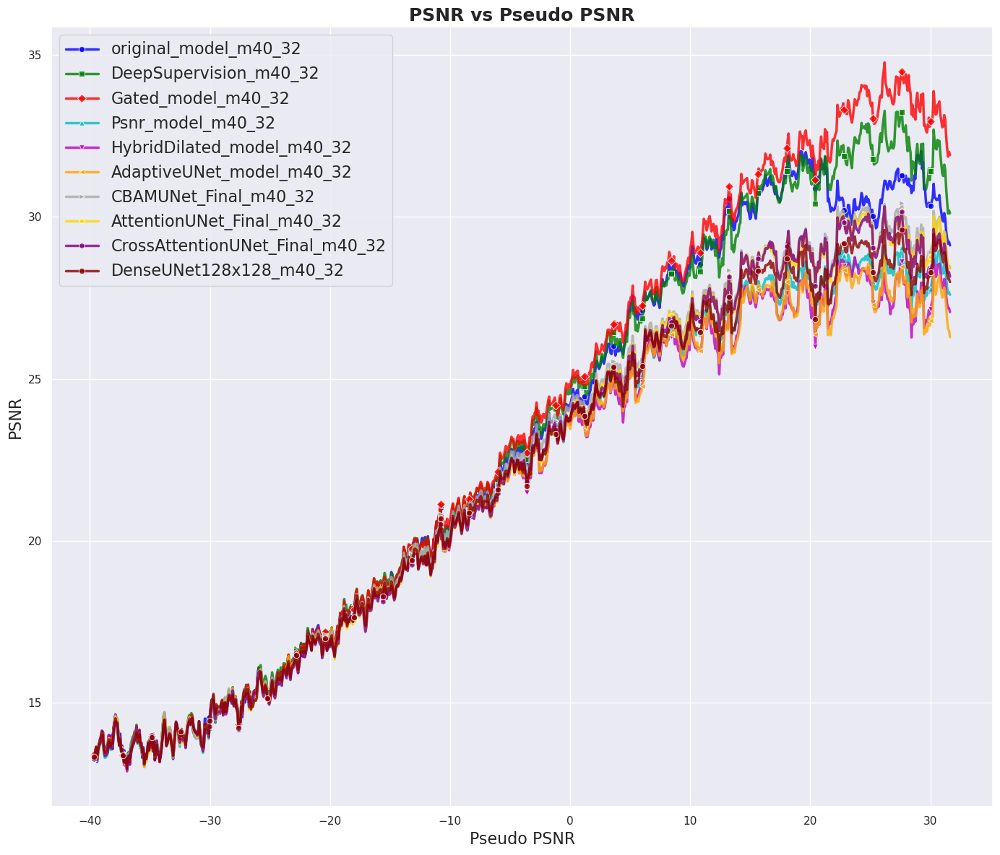

In [164]:
# Plots the PSNR Distribution for the PSNR Scores.
plt.figure(figsize=(14, 12))  # Adjusted size for better visibility
sns.set_style("darkgrid")

# Markers and color scheme
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', 'h']
colors = ['b', 'g', 'r', 'c', 'm', 'orange', 'darkgray', "gold", "purple", "darkred"] # Use a colorblind-friendly palette
#line_styles = ['-', '--', '-.', ':'] 
# Limiting the number of labels to avoid clutter
labels = Smoothed_Psnr_Distribution.columns[1:11]

# Set markers to appear even less frequently to declutter
markers_on = [i for i in range(0, len(Smoothed_Psnr_Distribution), 30)]  # More spread out

# Plotting each model with clearer settings
for idx, psnr in enumerate(Smoothed_Psnr_Distribution.columns[1:11]):
    marker = markers[idx % len(markers)]
    label = labels[idx % len(labels)]
    color = colors[idx % len(colors)]
    #line_style = line_styles[idx % len(line_styles)]
    
    sns.lineplot(data=Smoothed_Psnr_Distribution, 
                 x="Pseudo_Psnr", 
                 y=psnr, 
                 alpha=0.8,  # More transparency to reduce visual clutter
                 color=color, 
                 linewidth=2.5,  # Slightly thinner lines for more clarity
                 label=label, 
                 markevery=markers_on,  # Markers appear less frequently
                 marker=marker,  
                 #linestyle=line_style,  # Different line style for each model
                 markersize=6)  # Slightly smaller markers to reduce visual noise

# Improving the labels, title, and grid clarity
plt.xlabel("Pseudo PSNR", fontsize=16)
plt.ylabel("PSNR", fontsize=16)
plt.grid(True)  # Fainter grid lines to avoid overpowering the plot

# Enhancing the title
plt.title("PSNR vs Pseudo PSNR", fontsize=18, fontweight='bold')

# Keeping the legend inside and improving its visibility
plt.legend(fontsize=16, loc="upper left", ncol=1, frameon=True)

# Adjust layout to fit everything neatly
plt.tight_layout()

plt.savefig("Figures/PsnrVsPseudoPsnrUnets_1.pdf", format='pdf', dpi = 300)
plt.show()

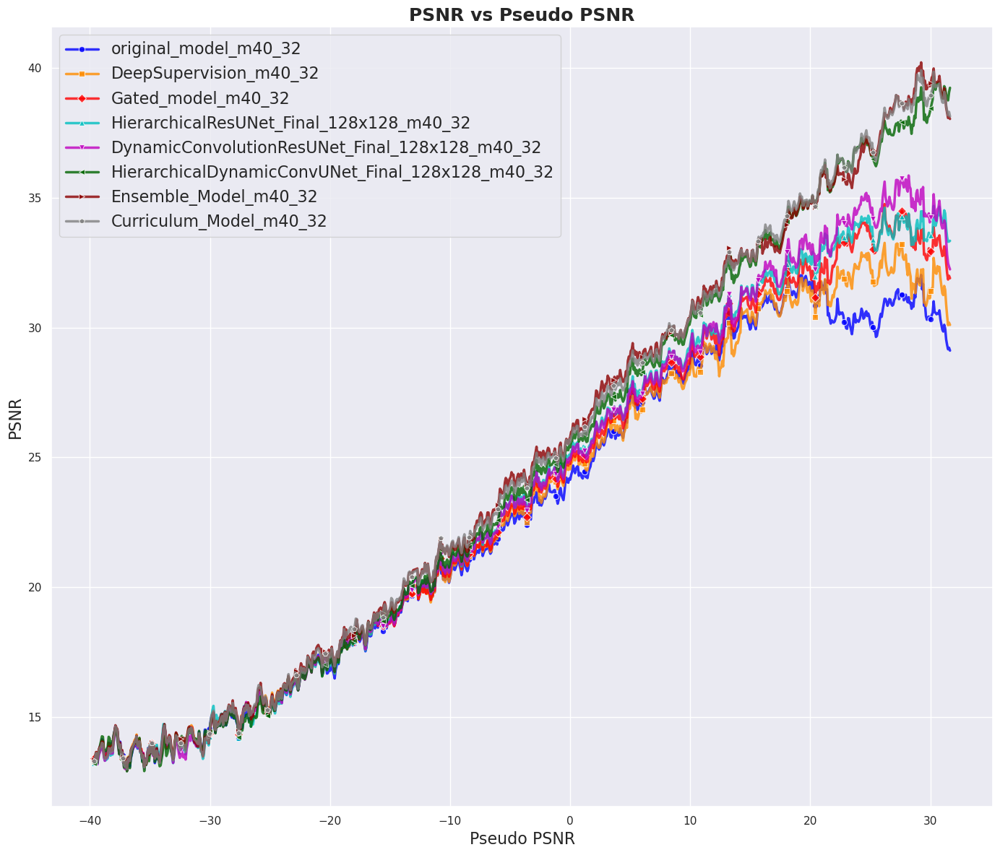

In [174]:
# Plots the PSNR Distribution for the PSNR Scores.
plt.figure(figsize=(14, 12))  # Adjusted size for better visibility
sns.set_style("darkgrid")

# Markers and color scheme
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', 'h']
colors = ['b', 'darkorange', 'r', 'c', 'm', 'darkgreen', 'darkred', "gray"] # Use a colorblind-friendly palette
#line_styles = ['-', '--', '-.', ':'] 
# Limiting the number of labels to avoid clutter
labels = []
labels.extend(list(Smoothed_Psnr_Distribution.columns[1:4]))
labels.extend(Smoothed_Psnr_Distribution.columns[11:])
labels

# Set markers to appear even less frequently to declutter
markers_on = [i for i in range(0, len(Smoothed_Psnr_Distribution), 30)]  # More spread out

# Plotting each model with clearer settings
for idx, psnr in enumerate(labels):
    marker = markers[idx % len(markers)]
    label = labels[idx % len(labels)]
    color = colors[idx % len(colors)]
    #line_style = line_styles[idx % len(line_styles)]
    
    sns.lineplot(data=Smoothed_Psnr_Distribution, 
                 x="Pseudo_Psnr", 
                 y=psnr, 
                 alpha=0.8,  # More transparency to reduce visual clutter
                 color=color, 
                 linewidth=2.5,  # Slightly thinner lines for more clarity
                 label=label, 
                 markevery=markers_on,  # Markers appear less frequently
                 marker=marker,  
                 #linestyle=line_style,  # Different line style for each model
                 markersize=6)  # Slightly smaller markers to reduce visual noise

# Improving the labels, title, and grid clarity
plt.xlabel("Pseudo PSNR", fontsize=16)
plt.ylabel("PSNR", fontsize=16)
plt.grid(True)  # Fainter grid lines to avoid overpowering the plot

# Enhancing the title
plt.title("PSNR vs Pseudo PSNR", fontsize=18, fontweight='bold')

# Keeping the legend inside and improving its visibility
plt.legend(fontsize=16, loc="upper left", ncol=1, frameon=True)

# Adjust layout to fit everything neatly
plt.tight_layout()
plt.savefig("Figures/PsnrVsPseudoPsnrUnets_2.pdf", format='pdf', dpi = 300)
plt.show()


In [166]:
# Smoothes the SSIM scores to produce a more accurate representation of the data.
Smoothed_SSIM_Distribution = SSIM_Distribution.rolling(window=10).mean()
Smoothed_SSIM_Distribution = Smoothed_SSIM_Distribution.dropna()
Smoothed_SSIM_Distribution

,Pseudo_Psnr,original_model_m40_32,DeepSupervision_m40_32,Gated_model_m40_32,Psnr_model_m40_32,HybridDilated_model_m40_32,AdaptiveUNet_model_m40_32,CBAMUNet_Final_m40_32,AttentionUNet_Final_m40_32,CrossAttentionUNet_Final_m40_32,DenseUNet128x128_m40_32,HierarchicalResUNet_Final_128x128_m40_32,DynamicConvolutionResUNet_Final_128x128_m40_32,HierarchicalDynamicConvUNet_Final_128x128_m40_32
9,-39.639600,0.351868,0.353741,0.357441,0.309182,0.320340,0.322053,0.321890,0.320353,0.314666,0.319339,0.351428,0.351055,0.348572
10,-39.559511,0.356867,0.359052,0.360538,0.313336,0.324215,0.327046,0.326134,0.323150,0.319148,0.323226,0.356842,0.356220,0.354861
11,-39.479422,0.345892,0.346386,0.347370,0.306379,0.316724,0.319503,0.318071,0.314601,0.311445,0.313622,0.344336,0.341607,0.339654
12,-39.399333,0.332943,0.332935,0.334170,0.293412,0.303854,0.307650,0.305043,0.301140,0.300154,0.300505,0.331775,0.328678,0.329212
13,-39.319244,0.327897,0.324937,0.326867,0.287452,0.299464,0.301074,0.297729,0.295042,0.292969,0.294397,0.323575,0.320498,0.322912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,31.319244,0.925335,0.949964,0.957340,0.823718,0.817391,0.812115,0.852056,0.849623,0.844181,0.852001,0.965121,0.963186,0.984405
896,31.399333,0.923415,0.949569,0.956686,0.817587,0.813551,0.806311,0.847915,0.843573,0.838642,0.848753,0.965195,0.962589,0.984608
897,31.479422,0.920253,0.944734,0.952955,0.814284,0.809743,0.798318,0.842841,0.840484,0.834657,0.845357,0.963025,0.958930,0.984481
898,31.559511,0.920735,0.944137,0.952839,0.814359,0.808785,0.798614,0.842820,0.839986,0.834367,0.846390,0.963250,0.957432,0.984995


In [167]:
Smoothed_SSIM_Distribution["Ensemble_Model_m40_32"] = SSIM_Distribution_Original
Smoothed_SSIM_Distribution["Curriculum_Model_m40_32"] = SSIM_Distribution_Curriculum

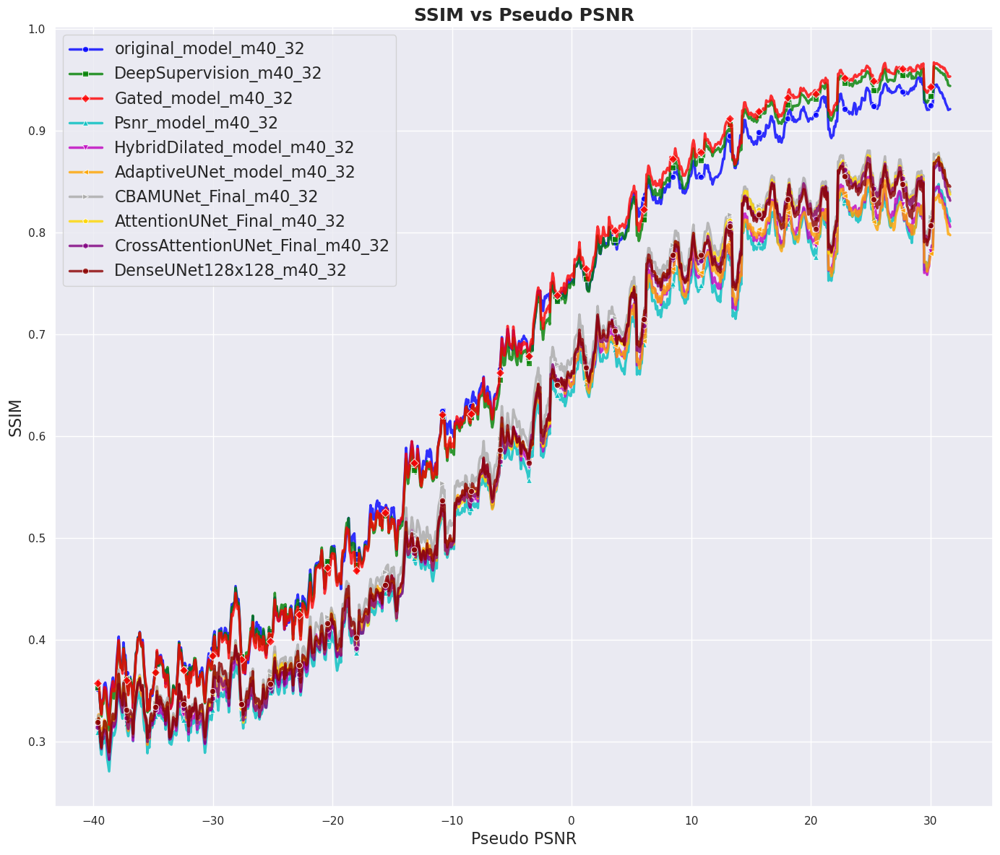

In [175]:
# Plots the PSNR Distribution for the PSNR Scores.
plt.figure(figsize=(14, 12))  # Adjusted size for better visibility
sns.set_style("darkgrid")

# Markers and color scheme
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', 'h']
colors = ['b', 'g', 'r', 'c', 'm', 'orange', 'darkgray', "gold", "purple", "darkred"] # Use a colorblind-friendly palette
#line_styles = ['-', '--', '-.', ':'] 
# Limiting the number of labels to avoid clutter
labels = Smoothed_SSIM_Distribution.columns[1:11]

# Set markers to appear even less frequently to declutter
markers_on = [i for i in range(0, len(Smoothed_SSIM_Distribution), 30)]  # More spread out

# Plotting each model with clearer settings
for idx, ssim in enumerate(Smoothed_SSIM_Distribution.columns[1:11]):
    marker = markers[idx % len(markers)]
    label = labels[idx % len(labels)]
    color = colors[idx % len(colors)]
    #line_style = line_styles[idx % len(line_styles)]
    
    sns.lineplot(data=Smoothed_SSIM_Distribution, 
                 x="Pseudo_Psnr", 
                 y=ssim, 
                 alpha=0.8,  # More transparency to reduce visual clutter
                 color=color, 
                 linewidth=2.5,  # Slightly thinner lines for more clarity
                 label=label, 
                 markevery=markers_on,  # Markers appear less frequently
                 marker=marker,  
                 #linestyle=line_style,  # Different line style for each model
                 markersize=6)  # Slightly smaller markers to reduce visual noise

# Improving the labels, title, and grid clarity
plt.xlabel("Pseudo PSNR", fontsize=16)
plt.ylabel("SSIM", fontsize=16)
plt.grid(True)  # Fainter grid lines to avoid overpowering the plot

# Enhancing the title
plt.title("SSIM vs Pseudo PSNR", fontsize=18, fontweight='bold')

# Keeping the legend inside and improving its visibility
plt.legend(fontsize=16, loc="upper left", ncol=1, frameon=True)

# Adjust layout to fit everything neatly
plt.tight_layout()
plt.savefig("Figures/SSIMVsPseudoPsnrUnets_1.pdf", format='pdf', dpi = 300)
plt.show()

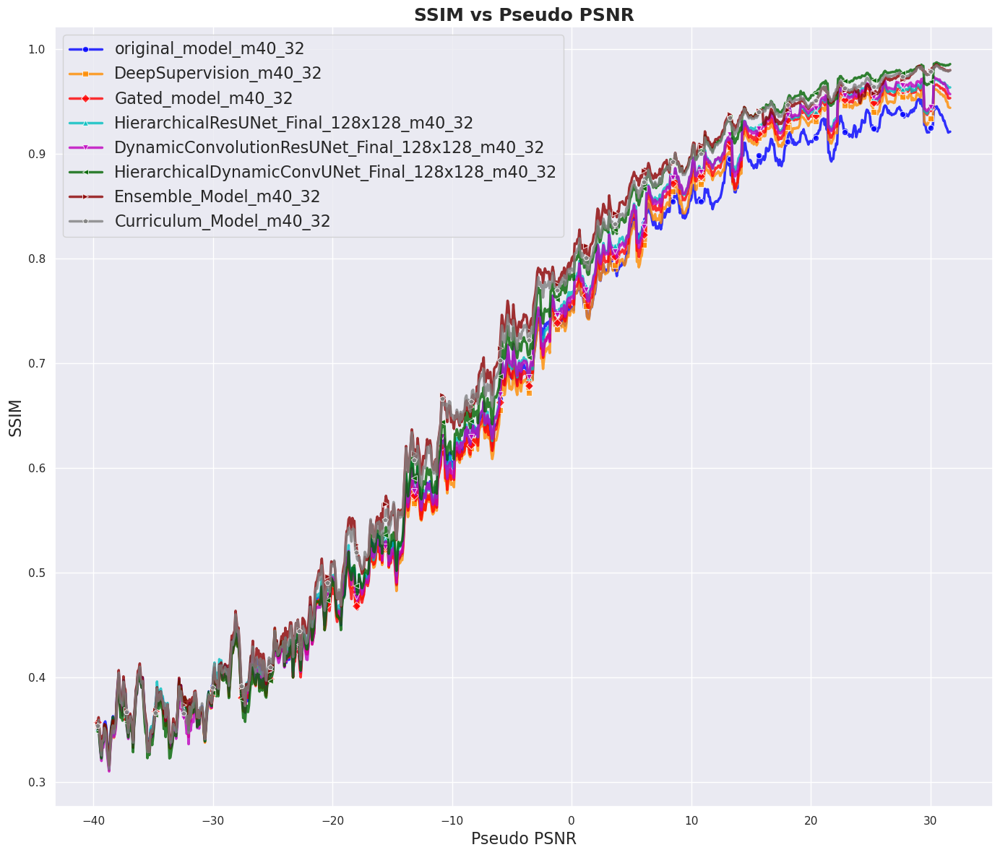

In [176]:
# Plots the PSNR Distribution for the PSNR Scores.
plt.figure(figsize=(14, 12))  # Adjusted size for better visibility
sns.set_style("darkgrid")

# Markers and color scheme
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', 'h']
colors = ['b', 'darkorange', 'r', 'c', 'm', 'darkgreen', 'darkred', "gray"] # Use a colorblind-friendly palette
#line_styles = ['-', '--', '-.', ':'] 
# Limiting the number of labels to avoid clutter
labels = []
labels.extend(list(Smoothed_SSIM_Distribution.columns[1:4]))
labels.extend(Smoothed_SSIM_Distribution.columns[11:])
labels

# Set markers to appear even less frequently to declutter
markers_on = [i for i in range(0, len(Smoothed_SSIM_Distribution), 30)]  # More spread out

# Plotting each model with clearer settings
for idx, ssim in enumerate(labels):
    marker = markers[idx % len(markers)]
    label = labels[idx % len(labels)]
    color = colors[idx % len(colors)]
    #line_style = line_styles[idx % len(line_styles)]
    
    sns.lineplot(data=Smoothed_SSIM_Distribution, 
                 x="Pseudo_Psnr", 
                 y = ssim, 
                 alpha=0.8,  # More transparency to reduce visual clutter
                 color=color, 
                 linewidth=2.5,  # Slightly thinner lines for more clarity
                 label=label, 
                 markevery=markers_on,  # Markers appear less frequently
                 marker=marker,  
                 #linestyle=line_style,  # Different line style for each model
                 markersize=6)  # Slightly smaller markers to reduce visual noise

# Improving the labels, title, and grid clarity
plt.xlabel("Pseudo PSNR", fontsize=16)
plt.ylabel("SSIM", fontsize=16)
plt.grid(True)  # Fainter grid lines to avoid overpowering the plot

# Enhancing the title
plt.title("SSIM vs Pseudo PSNR", fontsize=18, fontweight='bold')

# Keeping the legend inside and improving its visibility
plt.legend(fontsize=16, loc="upper left", ncol=1, frameon=True)

# Adjust layout to fit everything neatly
plt.tight_layout()
plt.savefig("Figures/SSIMVsPseudoPsnrUnets_2.pdf", format='pdf', dpi = 300)
plt.show()

In [170]:
# Smoothes the Perceptual Loss Scores for the Enhanced Gated U-Net Model.
Smoothed_Perceptual_Distribution = Perceptual_Distribution.rolling(window=10).mean()
Smoothed_Perceptual_Distribution = Smoothed_Perceptual_Distribution.dropna()
Smoothed_Perceptual_Distribution

,Pseudo_Psnr,original_model_m40_32,DeepSupervision_m40_32,Gated_model_m40_32,Psnr_model_m40_32,HybridDilated_model_m40_32,AdaptiveUNet_model_m40_32,CBAMUNet_Final_m40_32,AttentionUNet_Final_m40_32,CrossAttentionUNet_Final_m40_32,DenseUNet128x128_m40_32,HierarchicalResUNet_Final_128x128_m40_32,DynamicConvolutionResUNet_Final_128x128_m40_32,HierarchicalDynamicConvUNet_Final_128x128_m40_32
9,-39.639600,0.135467,0.135483,0.135447,0.135446,0.135457,0.135453,0.135455,0.135460,0.135464,0.135462,0.135447,0.135447,0.135447
10,-39.559511,0.136927,0.136944,0.136908,0.136910,0.136918,0.136913,0.136916,0.136922,0.136925,0.136923,0.136909,0.136908,0.136910
11,-39.479422,0.135272,0.135291,0.135254,0.135255,0.135263,0.135258,0.135261,0.135269,0.135272,0.135269,0.135256,0.135255,0.135256
12,-39.399333,0.134909,0.134934,0.134893,0.134891,0.134902,0.134895,0.134901,0.134908,0.134912,0.134908,0.134908,0.134908,0.134910
13,-39.319244,0.127537,0.127557,0.127523,0.127519,0.127532,0.127524,0.127530,0.127537,0.127541,0.127535,0.127532,0.127532,0.127535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,31.319244,0.648668,0.656001,0.663722,0.633026,0.623462,0.613728,0.647959,0.634838,0.631574,0.635587,0.676621,0.676042,0.696215
896,31.399333,0.655081,0.663052,0.671072,0.639572,0.631445,0.619399,0.653913,0.642893,0.638246,0.643579,0.682673,0.683583,0.703062
897,31.479422,0.649299,0.656643,0.665572,0.632338,0.625560,0.612216,0.647257,0.637001,0.631306,0.636188,0.675376,0.676919,0.698553
898,31.559511,0.653860,0.663520,0.671638,0.633598,0.629658,0.615320,0.649775,0.639094,0.632942,0.638386,0.681127,0.681532,0.704005


In [171]:
Smoothed_Perceptual_Distribution["Ensemble_Model_m40_32"] = Perceptual_Distribution_Original
Smoothed_Perceptual_Distribution["Curriculum_Model_m40_32"] = Perceptual_Distribution_Curriculum

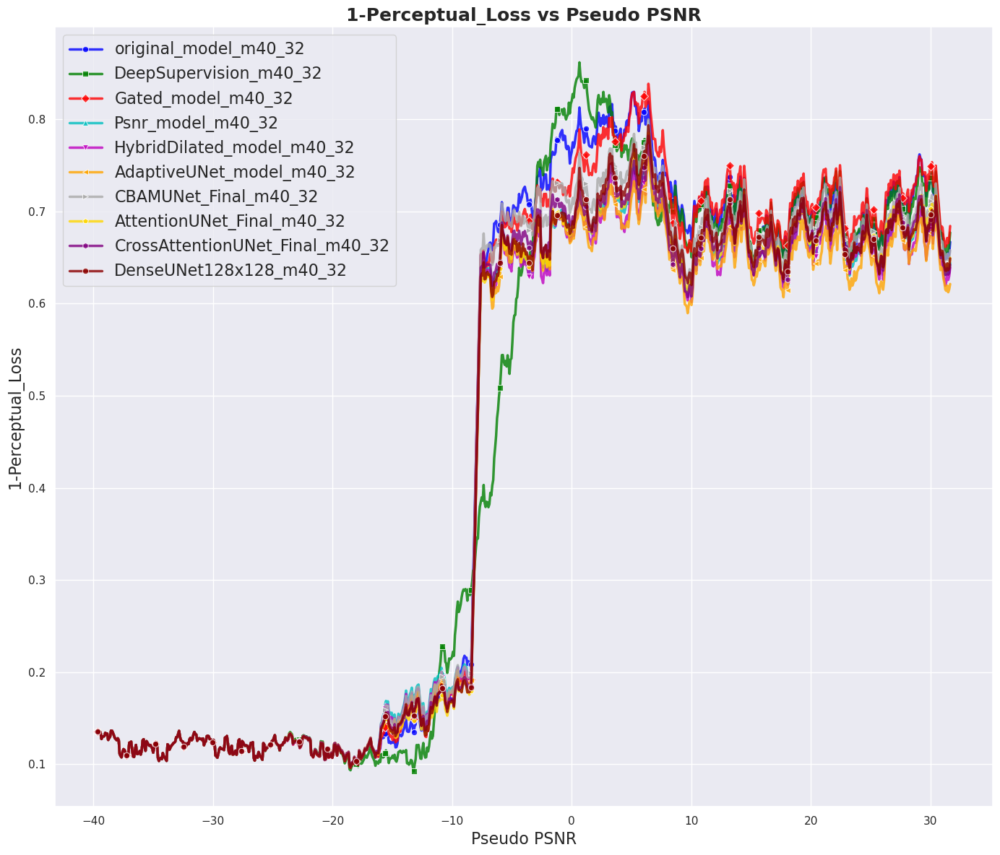

In [177]:
# Plots the PSNR Distribution for the PSNR Scores.
plt.figure(figsize=(14, 12))  # Adjusted size for better visibility
sns.set_style("darkgrid")

# Markers and color scheme
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', 'h']
colors = ['b', 'g', 'r', 'c', 'm', 'orange', 'darkgray', "gold", "purple", "darkred"] # Use a colorblind-friendly palette
#line_styles = ['-', '--', '-.', ':'] 
# Limiting the number of labels to avoid clutter
labels = Smoothed_Perceptual_Distribution.columns[1:11]

# Set markers to appear even less frequently to declutter
markers_on = [i for i in range(0, len(Smoothed_Perceptual_Distribution), 30)]  # More spread out

# Plotting each model with clearer settings
for idx, perceptual in enumerate(Smoothed_Perceptual_Distribution.columns[1:11]):
    marker = markers[idx % len(markers)]
    label = labels[idx % len(labels)]
    color = colors[idx % len(colors)]
    #line_style = line_styles[idx % len(line_styles)]
    
    sns.lineplot(data=Smoothed_Perceptual_Distribution, 
                 x="Pseudo_Psnr", 
                 y=perceptual, 
                 alpha=0.8,  # More transparency to reduce visual clutter
                 color=color, 
                 linewidth=2.5,  # Slightly thinner lines for more clarity
                 label=label, 
                 markevery=markers_on,  # Markers appear less frequently
                 marker=marker,  
                 #linestyle=line_style,  # Different line style for each model
                 markersize=6)  # Slightly smaller markers to reduce visual noise

# Improving the labels, title, and grid clarity
plt.xlabel("Pseudo PSNR", fontsize=16)
plt.ylabel("1-Perceptual_Loss", fontsize=16)
plt.grid(True)  # Fainter grid lines to avoid overpowering the plot

# Enhancing the title
plt.title("1-Perceptual_Loss vs Pseudo PSNR", fontsize=18, fontweight='bold')

# Keeping the legend inside and improving its visibility
plt.legend(fontsize=16, loc="upper left", ncol=1, frameon=True)

# Adjust layout to fit everything neatly
plt.tight_layout()
plt.savefig("Figures/PerceptualVsPseudoPsnrUnets_1.pdf", format='pdf', dpi = 300)
plt.show()

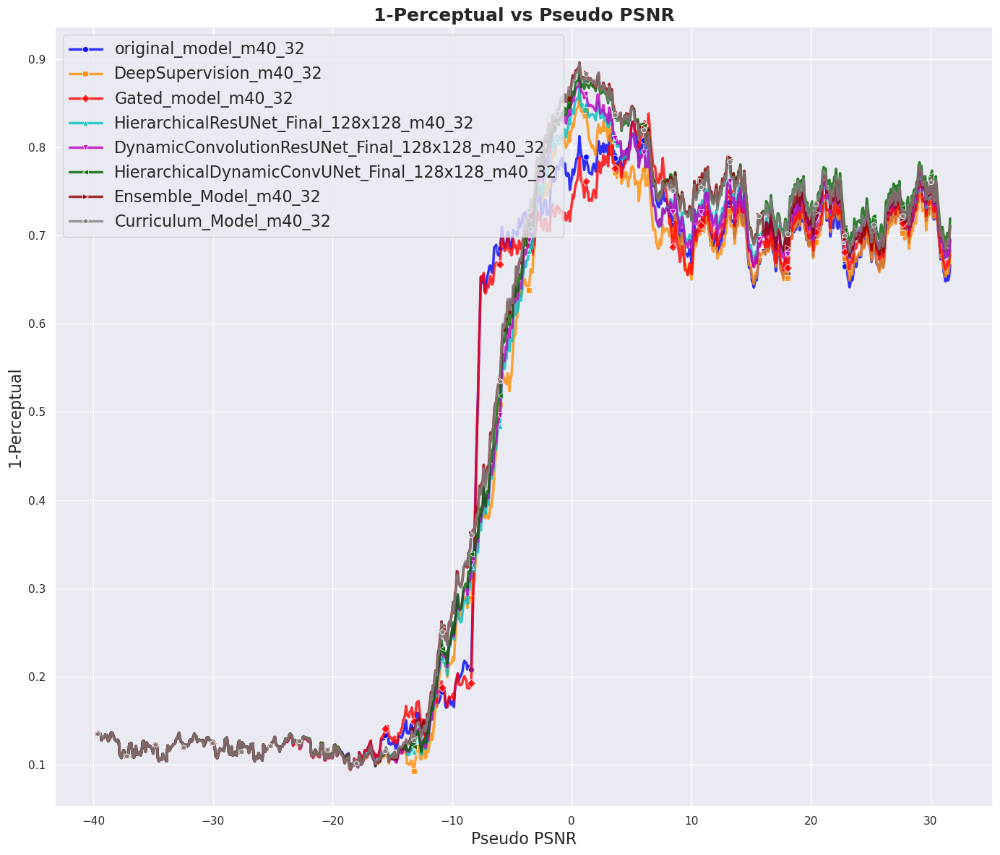

In [178]:
# Plots the PSNR Distribution for the PSNR Scores.
plt.figure(figsize=(14, 12))  # Adjusted size for better visibility
sns.set_style("darkgrid")

# Markers and color scheme
markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', 'h']
colors = ['b', 'darkorange', 'r', 'c', 'm', 'darkgreen', 'darkred', "gray"] # Use a colorblind-friendly palette
#line_styles = ['-', '--', '-.', ':'] 
# Limiting the number of labels to avoid clutter
labels = []
labels.extend(list(Smoothed_Perceptual_Distribution.columns[1:4]))
labels.extend(Smoothed_Perceptual_Distribution.columns[11:])
labels

# Set markers to appear even less frequently to declutter
markers_on = [i for i in range(0, len(Smoothed_Perceptual_Distribution), 30)]  # More spread out

# Plotting each model with clearer settings
for idx, psnr in enumerate(labels):
    marker = markers[idx % len(markers)]
    label = labels[idx % len(labels)]
    color = colors[idx % len(colors)]
    #line_style = line_styles[idx % len(line_styles)]
    
    sns.lineplot(data=Smoothed_Perceptual_Distribution, 
                 x="Pseudo_Psnr", 
                 y=psnr, 
                 alpha=0.8,  # More transparency to reduce visual clutter
                 color=color, 
                 linewidth=2.5,  # Slightly thinner lines for more clarity
                 label=label, 
                 markevery=markers_on,  # Markers appear less frequently
                 marker=marker,  
                 #linestyle=line_style,  # Different line style for each model
                 markersize=6)  # Slightly smaller markers to reduce visual noise

# Improving the labels, title, and grid clarity
plt.xlabel("Pseudo PSNR", fontsize=16)
plt.ylabel("1-Perceptual", fontsize=16)
plt.grid(True)  # Fainter grid lines to avoid overpowering the plot

# Enhancing the title
plt.title("1-Perceptual vs Pseudo PSNR", fontsize=18, fontweight='bold')

# Keeping the legend inside and improving its visibility
plt.legend(fontsize=16, loc="upper left", ncol=1, frameon=True)

# Adjust layout to fit everything neatly
plt.tight_layout()
plt.savefig("Figures/PerceptualVsPseudoPsnrUnets_2.pdf", format='pdf', dpi = 300)
plt.show()